## <font color='blue'>Ejercicio 1: OPTIMIZANDO k-MEANS y DBSCAN (4 puntos)</font>

<font color='blue'>La optimización de algoritmos de clustering como k-Means y DBSCAN en aprendizaje automático es fundamental para abordar aplicaciones reales debido a varias razones críticas. Primero, estas técnicas son ampliamente aplicadas en la segmentación de clientes, detección de anomalías, sistemas de recomendación, y otras áreas donde la agrupación efectiva de datos es crucial para extraer _insights_ significativos y tomar decisiones informadas. Optimizar estos algoritmos permite manejar grandes volúmenes de datos de manera eficiente, mejorando la velocidad y reduciendo los costos computacionales, lo cual es esencial en entornos donde el tiempo y los recursos son limitados. Además, al afinar estos métodos para incrementar su precisión y sensibilidad, se pueden identificar patrones y tendencias con mayor exactitud, lo que resulta en modelos más robustos y confiables. En un mundo donde los datos crecen exponencialmente, la capacidad de procesar y analizar esta información de manera efectiva es clave para el éxito en diversas aplicaciones prácticas, haciendo de la optimización y uso (incluso como parte de estrategias complejas de entrenamiento) de algoritmos de _clustering_ un componente indispensable en el campo del _machine learning_.

<font color='blue'>En este ejercicio intentaremos profundizar un poco en cómo optimizar y operar con dos algoritmos de clustering básicos (k-Means y DBSCAN).



---




<font color='blue'>Primero, importamos las librerías necesarias y fijamos la semilla aleatoria para que nuestros resultados sean reproducibles entre ejecuciones.


In [236]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn

# Fijamos la semilla aleatoria
np.random.seed(42) #¿Por qué 42? https://en.wikipedia.org/wiki/Phrases_from_The_Hitchhiker%27s_Guide_to_the_Galaxy

# Cambiamos aspecto de los gráficos
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)





---






### <font color='blue'>Ejercicio 1.A: Optimizando k-Means (3 puntos)</font>

<font color='blue'> Vamos a entrenar un agrupador K-Means en un conjunto de datos sintético en 2D, y vamos a intentar encontrar el centro de cada mancha y asignar cada instancia a la mancha/agrupación más cercana. Las tareas concretas a realizar en este ejercicio se resumen a continuación:
1.   Completamos el código con el ajuste de un `KMeans` usando 5 clusters y el hiperparámetro `n_init` con un valor igual a 1. Este hiperparámetro nos dice el número de veces que se ejecuta el algoritmo k-means con diferentes semillas de centroide (inicializaciones aleatorias). El resultado final es el mejor resultado de `n_init` ejecuciones consecutivas en términos de inercia. En general, suele ser recomendable emplear varias ejecuciones (especialmente, en problemas con alta dimensionalidad).
2.   Cada instancia se asignará a uno de los cinco clusters. En el contexto del clustering, la etiqueta de una instancia es el índice del cluster al que el algoritmo asigna esta instancia; esto no debe confundirse con las etiquetas de clase en clasificación, que se utilizan como objetivos. La instancia `KMeans` conserva las etiquetas predichas de las instancias con las que se entrenó, disponibles a través de la variable de instancia `labels_`. Imprimimos los centros de los 5 clusters y dibujamos los bordes de decisión de los 5 clusters obtenidos.
3. Predecimos cuatro nuevas instancias con valores `[[0, 2], [3, 2], [-3, 3], [-3, 2.5]]` utilizando el enfoque de clustering duro (`predict`) y clustering flexible (`transform`). En el primer caso, se proporciona uno de los clusters como aquel al que pertenece la instancia bajo estudio (es decir, cada instancia se asume que pertenece a un único cluster). En el segundo, se recupera un valor de pertenencia difuso/parcial de la instancia a cada uno de los clusters (es decir, cada instancia tiene un cierto grado de pertenencia a cada uno de los clusters).
4. A continuación, vamos a ver de qué forma influye la inicialización de los centroides en el resultado final. Vamos a escoger, de forma aproximada, dónde se pueden poner los 5 centroides para comenzar a iterar con un k-means. Para ello se puede lanzar `KMeans` con el hiperparámetro `n_init=1` y el hiperparámetro `init` con un `np.array` de 5 puntos en 2D escogidos manualmente por el estudiante. Prueba qué ocurre en este caso, imprimiendo los centros y dibujando los bordes de decisión de los 5 clusters obtenidos.
5. En la mayoría de casos reales y de interés, no es viable saber dónde están los centroides, pues los datos son más complejos. Para estos casos, el hiperpárametro `n_init` tiene un valor por defecto de 10; lo que significa que todo el algoritmo se ejecuta 10 veces cuando se llama a `fit()`, y Scikit-Learn se queda con la mejor solución. Pero, ¿cómo sabe exactamente qué solución es la mejor? Utiliza una métrica de rendimiento. Esa métrica se llama inercia del modelo, que es la suma de las distancias al cuadrado entre las instancias y sus centroides más cercanos. La clase `KMeans` ejecuta el algoritmo `n_init` veces y se queda con el modelo con la inercia más baja. La inercia de un modelo es accesible a través de la variable de instancia `inertia_`. El método `score()` devuelve la inercia negativa. ¿Por qué crees que devuelve el valor negativo? Imprime los valores `inertia_` y `score()` obtenidos en el apartado anterior.
6. Prueba diferentes métodos de inicialización (hiperparámetro `init`) y diferentes variantes de k-Medias con el hiperparámetro `algorithm`. Describe cada método de inicialización y compara gráficamente el resultado. ¿Notas diferencias significativas en las figuras representadas? ¿Por qué?
7. Vamos a encontrar el número óptimo de clusters utilizando el silhouette score, que lo podéis encontrar en `sklearn.metrics` importando `silhouette_score`.  Vamos a visualizar  este score para diferente número de clusters, desde 2 hasta 15  (ambos inclusive): eje X (número de clusters) vs eje Y (silhouette score).  Aquí utilizaremos el valor `n_init=10`. Analiza los resultados obtenidos.
8. Se puede obtener una visualización aún más informativa si representamos el coeficiente
de silueta de cada instancia, ordenado por los clusters a los que está asignada y
por el valor del coeficiente. Esto se denomina diagrama de siluetas
(véase https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html).
Cada diagrama contiene una forma de cuchillo por cluster. La altura de la forma indica el número
de instancias en el cluster, y su anchura representa los coeficientes de silueta
ordenados de las instancias en el cluster (más ancho es mejor). Dibuja los
coeficientes de silueta para un $k=\{3,4,5,6\}$ y analiza los resultados obtenidos.
9. El conjunto de datos clásico de Olivetti contiene 400 imágenes de rostros en escala
de grises de 64×64 píxeles. Cada imagen se aplana a un vector 1D de tamaño 4.096.
Se fotografiaron 40 personas diferentes (10 veces cada una), y la tarea habitual es
entrenar un modelo que pueda predecir qué persona está representada en cada imagen.
Carga el conjunto de datos utilizando la función `sklearn.datasets.fetch_olivetti_faces()`
y, a continuación, divídelo en un conjunto de entrenamiento y
unode test (ten en cuenta que el conjunto de datos ya está escalado entre 0 y 1).
Dado que el conjunto de datos es bastante pequeño, probablemente necesitaremos utilizar un muestreo
estratificado (`StratifiedShuffleSplit`) para asegurarnos de que hay el mismo número de imágenes por persona/clase/cluster en cada conjunto.
A continuación, agrupa las imágenes utilizando tres modelos de k-means (k-means++ con `n_init=10`,
random con `n_init=1`, y random con `n_init=10` y el algoritmo ` elkan` para agilizar cómputo), y
asegúrate de que empleamos un buen número de clústers (utilizando técnicas de los apartados anteriores).
Visualiza los clusters utilizando el mejor modelo (bajo tu criterio, que debes justificar) de los tres previos: ¿ves caras
similares en cada cluster? Es decir, ¿hemos sido capaces de agrupar rostros de las mismas personas de forma no supervisada? ¿Cómo de buenas son las predicciones realizadas con el conjunto de test: se corresponden adecuadamente con las identidades de entrenamiento?
¿Qué conclusiones extraes en base al trabajo realizado y los resultados obtenidos?
NOTA: Puedes utilizar reducción de dimensionalidad para agilizar el cómputo.

<font color='blue'> El alumnado debe describir en detalle el trabajo realizado y las conclusiones extraídas.

In [237]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

blobs_c = np.array([[ 0,  2.5], [-1.5 ,  2.3], [-2.8,  1.7],
                         [-2.6,  3.5], [-2.9,  1.4]])
blob_std = np.array([0.45, 0.25, 0.1, 0.1, 0.05])
X, y = make_blobs(n_samples=2000, centers=blobs_c, cluster_std=blob_std,
                  random_state=42)

<font color='blue'> Dibujamos las manchas.

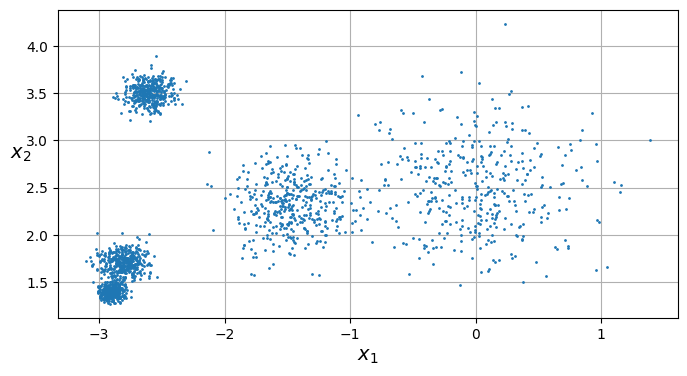

In [238]:
def plot_clusters(X, y=None):
    plt.scatter(X[:, 0], X[:, 1], c=y, s=1)
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$", rotation=0)

plt.figure(figsize=(8, 4))
plot_clusters(X)
plt.gca().set_axisbelow(True)
plt.grid()
plt.show()

**Explicación previa a todos los apartados**

Empezamos con el primer apartado. Vamos a usar ***KMeans***, profundizando en todos los aspectos relevantes del algoritmo. Se trata de un algoritmo de *clustering* para **aprendizaje no supervisado** (descubrir y analizar patrones ocultos y estructuras dentro de conjuntos de datos sin la necesidad de etiquetas de clase), es decir, intentar agrupar instancias similares en los mismos *clusters* o clases.

*K-means* es uno de los algoritmos de *clustering* más rápido y fácil de usar. Veámos **cómo funciona**:  

  1. Se inicializa el número de centroides que se quieran usar de manera aleatoria.
  2. Se asigna cada instancia del dataset al centroide que tenga más cercano.
  3. Se actualizan nuevos centroides: la media de las instancias que tiene asignado cada uno de ellos.
  4. Se vuelve a 2, hasta **convergencia** del algoritmo (intuitivamente, los centroides se estabilicen y dejen de moverse).



In [239]:
##Funcionamiento y convergencia de K-Means en 2D
from IPython.display import Image
Image(url='https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/K-means_convergence.gif/330px-K-means_convergence.gif')

Este ejemplo lo encontramos en las diapositivas de la práctica y la secuencia anterior se encuentra en https://en.wikipedia.org/wiki/K-means_clustering#

\\
#####**Apartado 1** y **apartado 2**

Etiquetas asignadas:  [2 3 4 ... 0 2 1]

Centros de los clusters: 
 [[ 0.0783778   2.16451394]
 [-2.85127128  1.55334118]
 [-2.60140129  3.49914817]
 [-0.0207084   2.89114195]
 [-1.44785999  2.31813847]]


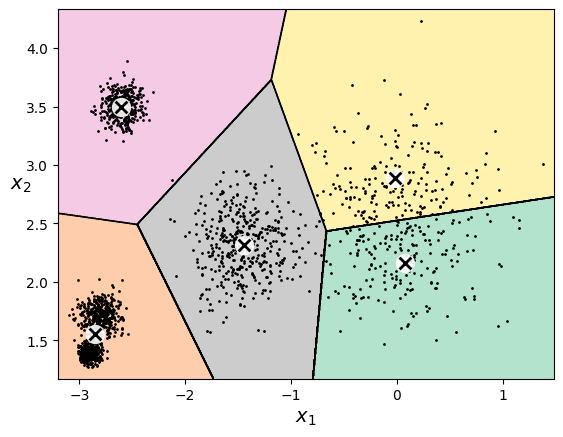

In [240]:
# Apartado 1
k = 5
kmeans = KMeans(n_clusters = k, n_init = 1, random_state = 42)

#Apartado 2
def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)

#Hacemos fit del modelo, mostrando las etiquetas (cluster) asociadas a cada instancia
# y los centros encontrados
kmeans.fit(X)
print("Etiquetas asignadas: ", kmeans.labels_)
print("\nCentros de los clusters: \n", kmeans.cluster_centers_)

#Mostramos los bordes de decisión
plot_decision_boundaries(kmeans, X)

Vemos, tras imprimir los centroides y los clusters resultantes (**Teselación de Voronoi**), guardados en nuestra instancia de *kmeans* el resultado de entrenar el algoritmo con 5 clusters, *n_init* = 1 y *random_state* = 42 (para mayor reproducibilidad de la ejecución).

El resultado obtenido parece no ser óptimo, pues, por ejemplo, abajo a la izquierda de la visualización, parecen apreciarse dos *clusters*, que *kmeans* ha identificado como uno mismo para todos los datos. Otro ejemplo bastante visual es a la derecha, que un grupo de datos parece haberlo divido en dos distintos (<font color='green'>verde <font color='black'> y <font color='yellow'>amarillo<font color='black'>).

\\
#####**Apartado 3**

Cluster predicho (duro):  [0 0 2 1]
Valor difuso de pertenencia a cada cluster (flexible): 
 [[0.18223039 2.88604435 3.00245465 0.89138253 1.48240029]
 [2.92625035 5.86829444 5.79854651 3.14941474 4.45922309]
 [3.18974087 1.45428401 0.63877213 2.98127968 1.69530934]
 [3.09660472 0.95827092 1.07572208 3.00485781 1.56275789]]


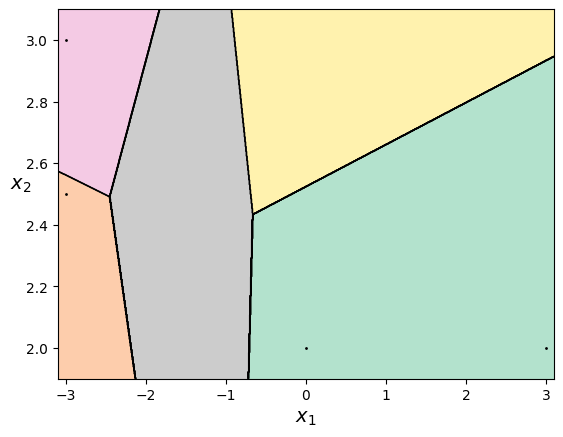

In [241]:
#Apartado 3
X_new = np.array([[0, 2], [3, 2], [-3, 3], [-3, 2.5]])

cluster_pred = kmeans.predict(X_new)    #Devuelve cluster de pertenencia
cluster_dif = kmeans.transform(X_new)   #Devuelve valor difuso de pertenencia (las distancias a los centros)

print("Cluster predicho (duro): ", cluster_pred)
print("Valor difuso de pertenencia a cada cluster (flexible): \n", cluster_dif)

#Mostramos los puntos predichos por el modelo y la teselación
plot_decision_boundaries(kmeans, X_new, show_centroids = False)

Veamos la diferencia de usar cada uno de los dos enfoques distintos:

  **Clustering duro:** Para la primera instancia se ha asignado el cluster de índice 4, o cluster nº 5, para la segunda también, para la tercera el primero de ellos y para la última el tercer cluster.

\\
  **Clustering flexible:** El modelo devuelve las **distancias** de cada una de las instancias a cada uno de los clusters distintos. Por ejemplo, la primera de las instancias está a distancia 3.0024 del centro del primer cluster, a 1.4839 del segundo...etc.

  Con esto se podría obtener una proporción entre 0 y 1 de pertenencia a cada uno de los clusters, haciendo inversamente proporcional la distancia a la pertenenca y normalizando. Esto es porque el grado de pertenencia se representa a menudo como un valor entre 0 y 1, donde 0 indica que el punto de datos no pertenece al clúster en absoluto, y 1 indica que pertenece completamente.

  Visualmente, ambos métodos de *clustering* se pueden resumir en la siguiente imagen:

  <center><img src =https://www.researchgate.net/profile/Ali-Al-Yousef/publication/341874469/figure/fig1/AS:898328594227203@1591189635588/Hard-vs-Soft-Clustering.ppm></center>

Extraída de https://www.researchgate.net/figure/Hard-vs-Soft-Clustering_fig1_341874469

  \\
#####**Apartado 4**

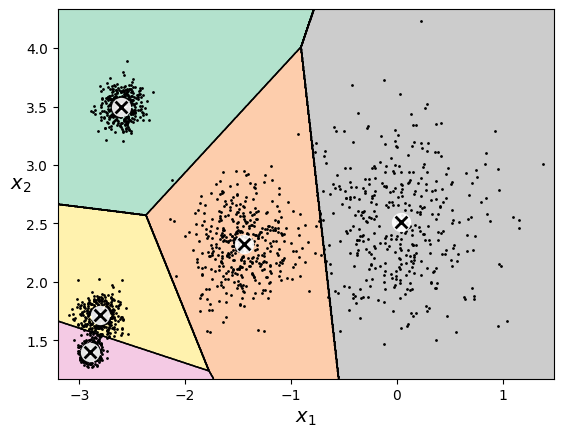

In [242]:
#Apartado 4

#Escogemos los centroides manualmente y los guardamos en un vector que pasaremos a KMeans
good_init = np.array([[-2.6, 3.5], [-1.5, 2.3], [-2.9, 1.3], [-2.8, 1.75], [0.1, 2.5]])

#Hacemos KMeans con inicialización manual
kmeans = KMeans(n_clusters = k, n_init = 1, init = good_init)
kmeans.fit(X)

#Visualizamos los bordes de decisión
plot_decision_boundaries(kmeans, X)

Tratamos de encontrar una disposición para los centroides que, visualmente, agrupe mejor los distintos clusters. Para ello, las dos agrupaciones que se comentaban antes, abajo a la izquierda, las intentamos separar en dos distintas y la agrupación de la derecha (<font color='grey'>gris<font color='black'>), la dejamos como un solo clúster.

Inicializar los centroides manualmente en K-Means puede ser factible en algunos casos, pero **generalmente no se recomienda**, especialmente si no tienes un buen conocimiento previo de los datos. La inicialización manual de los centroides puede **sesgar** el algoritmo hacia ciertos clústeres o hacer que converja hacia una solución subóptima. Hay métodos de inicialización mucho más sofisticados que se abordan más tarde.

\\
#####**Apartado 5**

In [243]:
#Apartado 5
print("Valor de la inercia: \n", kmeans.inertia_)
print("\nValor del score: \n", kmeans.score(X))

Valor de la inercia: 
 212.06314862300178

Valor del score: 
 -212.0631486230018


La inercia se puede calcular como:

$$\text{Inercia} = \sum_{i=1}^{K} \sum_{x \in C_i} ||x - \mu_i||^2$$

Donde:
 - $K$ es el nº de clusters
 - $C_i$ es el conjunto de puntos pertenecientes al clúster $i$
 - $\mu_i$ es el centroide del clúster $i$
 - Se realiza la distancia euclídea desde cada punto al centroide

\\
Haciendo una búsqueda en *Hands-on Machine Learning with Scikit Learn Keras and TensorFlow* *(Géron, 2019, p. 245)*, en el que encontramos un ejemplo muy similar al nuestro, hablando de K-Means, se habla de la regla de **"great is better"**, es decir, cuanto más grande es mejor. Esto en términos de un modelo, viene a decir que si un modelo es mejor que otro, *score()* siempre debería devolver un score más alto.

Como en el caso de la *inertia* es un valor que queremos minimizar, cuanto más alto es pero, pero si lo devolvemos en negativo, cuanto más grande sea el valor en valor absoluto, peor será el modelo, y viceversa.

\\
Véase:

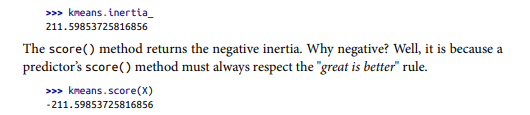

**Géron, A. (2019). Hands-on Machine Learning with Scikit-Learn, Keras, and TensorFlow: Concepts, Tools, and Techniques to Build Intelligent Systems (2nd ed.). O'Reilly Media.**


#####**Apartado 6**

El método por defecto implementado por sklearn es **k-means++**, visto en clase. Se trata de un proceso de inicialización más coherente para seleccionar los centroides iniciales. Esta coherencia reside en la elección que se hace teniendo en cuenta la distancia entre ellos, se escoge de manera que los centroides sean distantes entre ellos.

**¿Cómo funciona?**
  Se consigue dicha elección siguiendo los siguientes pasos, hasta escoger el número de centroides deseado:

  1. Se escoge el primer centroide de manera aleatoria.
  2. Se calcula la distancia de cada una de las no seleccionadas todavia al centroide más cercano ya elegido.
  3. Se escoge un nuevo centroide con probabilidad **proporcional a la distancia al cuadrado**, es decir, cuanto mayor distancia más probabilidad hay de escoger la instancia en cuestión.

Como es el usado por defecto, vamos a probar con el aleatorio (*random*) y también con la usada previamente, la manual. Para los algoritmos usados para k-means, la principial diferencia entre ***lloyd*** y ***elkan*** es la eficiencia computacional y la memoria necesitada para cada uno. **elkan** puede llegar a ser más eficiente para algunos datasets, pero necesita, en general, más memoria que **lloyd**.

Discutamos un poco más los algoritmos usados, pues las inicializaciones ya las hemos comentado previamente:

  * ***lloyd*** : Es el usado por defecto por k-means y ya ha sido comentado, pues este algoritmo es el que intenta minimizar las distancias al cuadrado de las instancias a los centroides.
  * ***elkan*** : Fue propuesto posteriormente y trata de ahorrar cálculos innecesarios de manera que puede dar mejoras en conjuntos de datos muy grandes. ¿Cómo consigue esto?

  Pues hace uso de la famosa **desigualdad triangular**. Es una versión *acelerada* de k-means y la presentó en el siguiente *paper* :
***Elkan, C. (2003). Using the Triangle Inequality to Accelerate k-means.***

  En él, Elkan logró mejorar el rendimiento del algoritmo explotando la desigualdad triangular, que establece que la línea recta siempre representa la distancia más corta entre dos puntos. Este enfoque implica mantener un seguimiento de los límites inferior y superior de las distancias entre las instancias y los centroides.

Número de iteraciones para  k-means++   9
Número de iteraciones para  k-means++   9
Número de iteraciones para  random   4
Número de iteraciones para  random   4
Número de iteraciones para init manual  2
Número de iteraciones para init manual  2




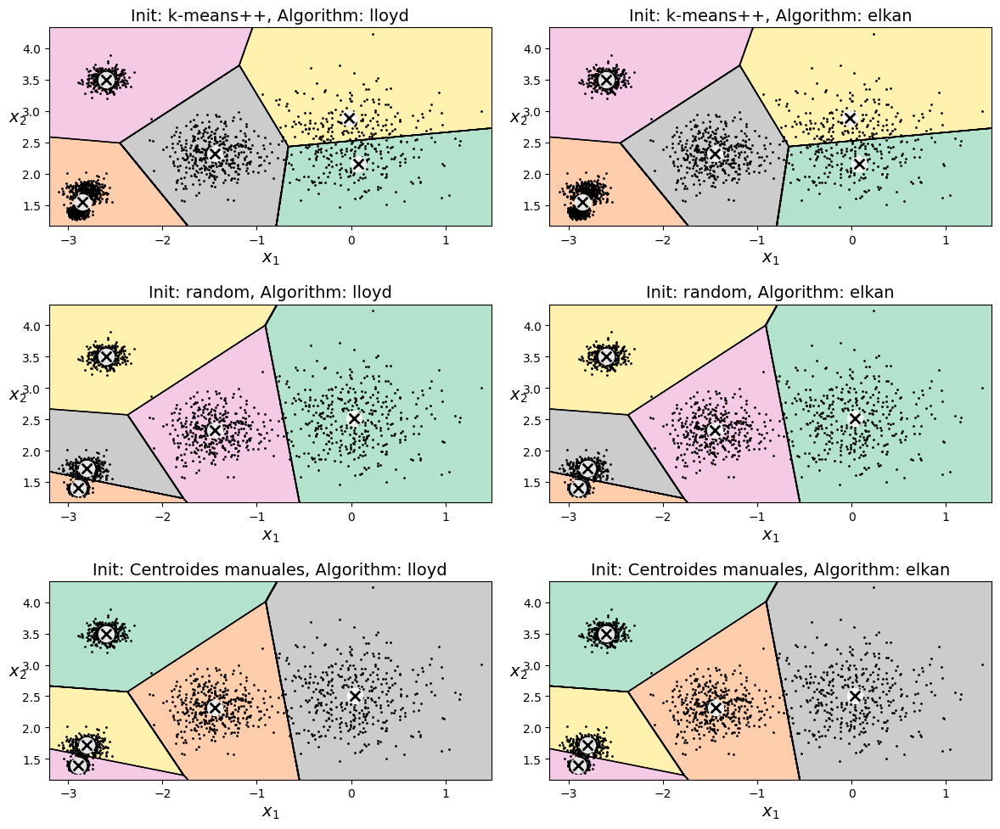

In [244]:
#Apartado 6
#Vamos a ejecutar distintas variantes, para ver la forma que dan
init_values = ['k-means++', 'random', good_init]
algorithm_values = ['lloyd', 'elkan']

fig, axs = plt.subplots(len(init_values), len(algorithm_values), figsize=(12, 10))

#En el bucle recorremos las distintas combinaciones de inicialización/algoritmo
for i, init in enumerate(init_values):
    for j, algorithm in enumerate(algorithm_values):
        # Creamos un nuevo modelo KMeans para la combinación actual de parámetros
        kmeans = KMeans(n_clusters=k, n_init=1, init=init, random_state=42, algorithm=algorithm)
        kmeans.fit(X)

        # Creamos un subplot y llamamos a la función plot_decision_boundaries
        plt.subplot(len(init_values), len(algorithm_values), i * len(algorithm_values) + j + 1)
        plot_decision_boundaries(kmeans, X)

        if isinstance(init, str):
            title = f'Init: {init}, Algorithm: {algorithm}'
            print("Número de iteraciones para ",  init, " ",  kmeans.n_iter_)
        else:
            title = f'Init: Centroides manuales, Algorithm: {algorithm}'
            print("Número de iteraciones para init manual ",  kmeans.n_iter_)
        plt.title(title)
print("\n")
plt.tight_layout()
plt.show()

La diferencia entre las distintas variables de algoritmos es muy sutil. De hecho, el único que parece diferir de los demás es *k-means++*, pero los otros dos (manual y *random*) dan un resultado muy similar o igual.

En primer lugar, la diferencia entre los algoritmos usados no es notable, pues, estamos trabajando con un conjunto de datos sintético y no muy grande (2000 muestras) y tampoco estamos midiendo rendimiento del modelo.

La poca diferencia entre las distintas inicializaciones se debe a la rápida **convergencia** de *k-means* en general. Para k-means++ parece converger más lento que random y sobre todo que la manual, pues hemos escogido los centroides a conciencia.
>*Escogiendo random_state = 43 vemos que random converge más lento (es lo que cabe esperar, k-means inicializa más "inteligentemente")*

Otros factores posibles a tener en cuenta para analizar las diferencias es la distribución de los datos; si son facilmente separables y agrupables el resultado será casi siempre el mismo.

#####**Apartado 7**

El coeficiente de silueta o silhouette score se calcula como:

\\
$$s(i) = \frac{b(i) - a(i)}{\max\{a(i), b(i)\}}$$

Donde:
* $a(i)$ es la distancia promedio entre la muestra $i$ y todas las demás muestras en el mismo clúster.
* $b(i)$ es la distancia promedio entre la muestra $i$ y todas las muestras en el clúster más cercano diferente de aquel al que pertenece la muestra $i$.

El coeficiente de Silhouette varía en el rango de -1 a 1. Los valores cercanos a 1 indican que la muestra está bien clasificada y los valores cercanos a -1 indican que la muestra puede haber sido asignada al clúster incorrecto. Los valores cercanos a 0 pueden indicar que la muestra está cerca del límite entre dos clústeres.

Veámos que resultados tenemos para los distintos números de clusters pedidos:



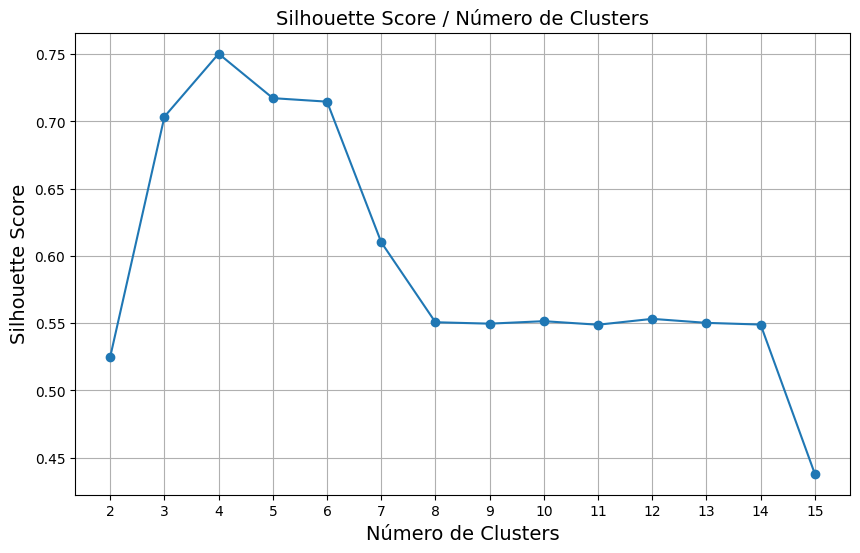

In [245]:
#Apartado 7
from sklearn.metrics import silhouette_score

rango_clusters = range(2, 16)
silhouette_scores = []

for num_clusters in rango_clusters:

    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
    kmeans.fit(X)

    silhouette_scores.append(silhouette_score(X, kmeans.labels_))

plt.figure(figsize=(10, 6))
plt.plot(rango_clusters, silhouette_scores, marker='o')
plt.title('Silhouette Score / Número de Clusters')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(rango_clusters)
plt.grid(True)
plt.show()

Es una métrica útil para evaluar la calidad del clustering y puede ayudarnos a seleccionar el número óptimo de clústeres al analizar cómo varía el coeficiente de Silhouette con diferentes números de clústeres.

Como aparentemente nº clusters = 4, nos da un resultado mejor para el *score*. Podríamos pensar que es el adecuado, pero visualmente hay 5 grupos de datos.

Vemos a continuación un enfoque distinto para el análisis del número de clusters:

#####**Apartado 8**

El **diagrama de siluetas** es una herramienta, más bien visual, utilizada para evaluar la calidad de un clustering. Proporciona una medida de cómo de bien separados están los clusters. El diagrama de siluetas asigna a cada punto de datos un valor de silueta que indica qué tan similar es ese punto a su propio cluster en comparación con otros clusters cercanos.

Muestra estos valores de silueta para todos los puntos en un conjunto de datos, proporcionando una visión general de la calidad del clustering. Un diagrama de siluetas con picos bien pronunciados y una distribución uniforme de valores altos (cercanos a 1) es indicativo de un clustering robusto y bien definido.

En el ejemplo proporcionado se nos da el código que grafica tanto el diagrama de siluetas como la distribución de los puntos que ya conocíamos pero ahora con distintos colores, representando así el clúster al que pertenecen. Esta información es complementaria, pues así sabemos **cómo se está agrupando** y además **cómo de bien** se está haciendo:

Para n_clusters = 3 La media de silhouette_score es : 0.7035302391285877
Para n_clusters = 4 La media de silhouette_score es : 0.7502950206907029
Para n_clusters = 5 La media de silhouette_score es : 0.717314760221725
Para n_clusters = 6 La media de silhouette_score es : 0.7054044716585074


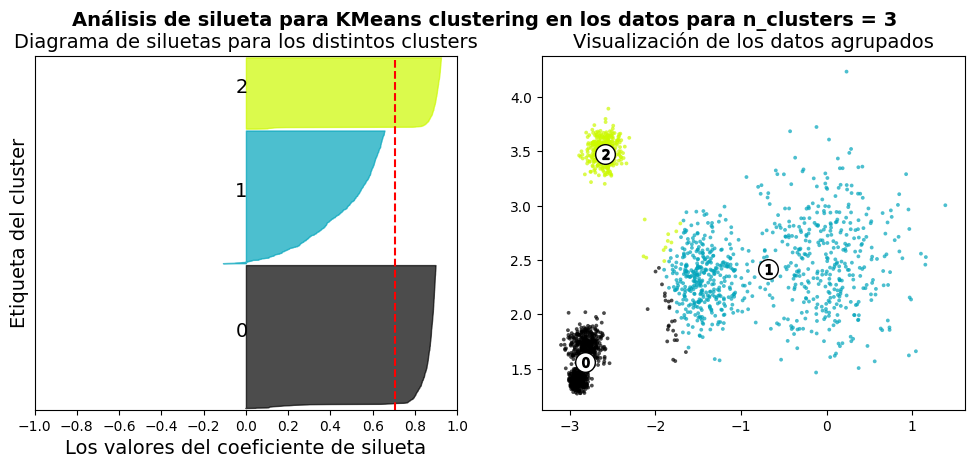

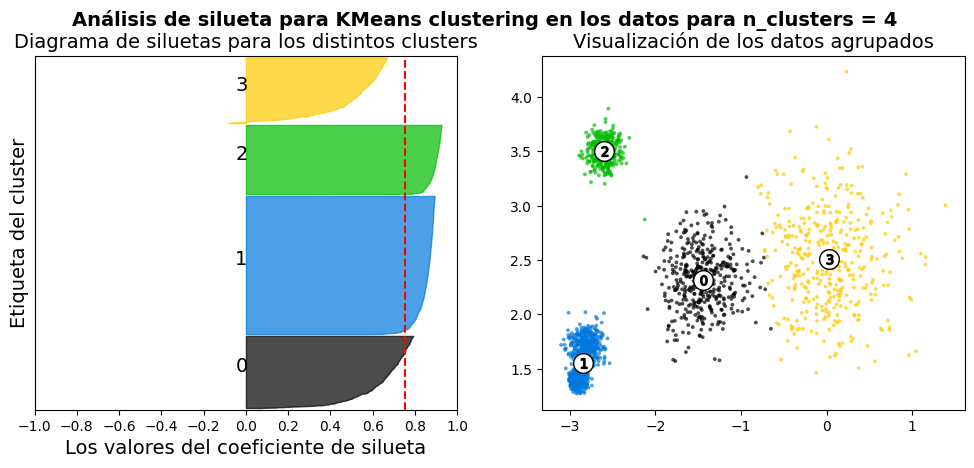

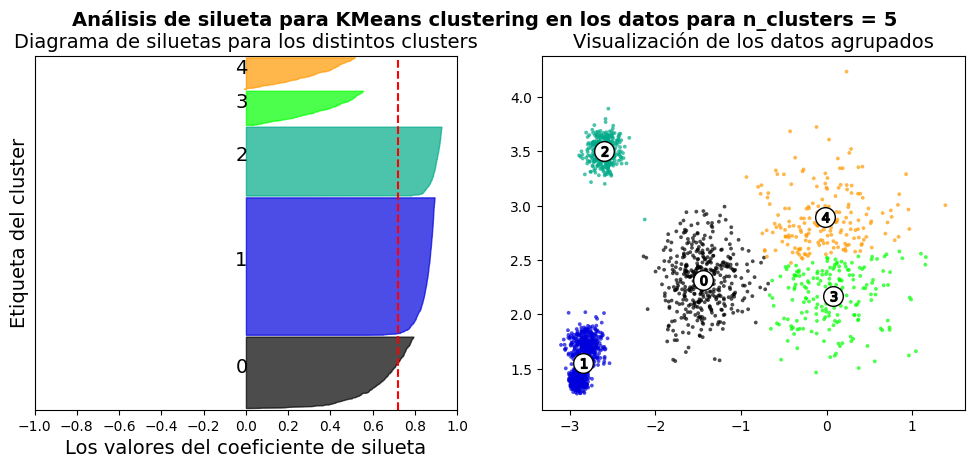

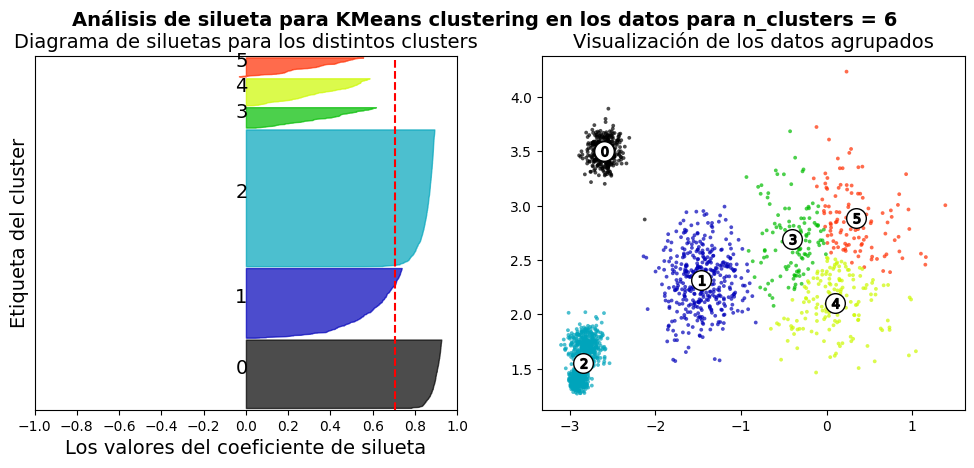

In [246]:
#Apartado 8
#Usamos el código proporcionado en el enunciado, que nos muestra tanto el diagrama de
# siluetas como la distribución de los datos con las asignaciones de clúster realizadas,
# informaciones que se complementan

from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib.cm as cm

range_n_clusters = [3, 4, 5, 6]

for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(12, 4.6)

    #Los límites del valor de silueta
    ax1.set_xlim([-1, 1])
    #Hacemos que haya espacio entre los "cuchillos"
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init = 10)
    cluster_labels = clusterer.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)
    print( "Para n_clusters =", n_clusters, "La media de silhouette_score es :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10

    ax1.set_title("Diagrama de siluetas para los distintos clusters")
    ax1.set_xlabel("Los valores del coeficiente de silueta")
    ax1.set_ylabel("Etiqueta del cluster")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])
    ax1.set_xticks([-1,-0.8,-0.6,-0.4,-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker="o", c="white", alpha=1, s=200, edgecolor="k")

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("Visualización de los datos agrupados")

    plt.suptitle(
        "Análisis de silueta para KMeans clustering en los datos para n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show();

Vemos que, en general, salvo para alguna instancia más alejada, los coeficientes siempre están por encima de 0, lo cual es indicativo de una buena asignación.

La media para 4 clústers (línea vertical discontinua de color rojo, además se muestra al principio de la salida), es la mayor de todas, aunque visualmente no tenga mucho sentido que el aparente clúster de la derecha se divida en dos. Pero como no tenemos más información acerca de los datos, nos quedamos con $K=4$. Sin embargo, como estamos en un problema sintético, sabemos que $K=5$ pues así se definen los datos (***se usan 5 centros con distintas distribuciones alrededor de ellos***). En este ejemplo concreto resulta que para 4 se obtienen mejores métricas por la distribución específica de los datos, aunque sepamos que el número de clústers es 5.

\\
#####**Apartado 9**

Se nos proporciona un dataset con 10 fotografías de 40 personas diferentes, todas ellas en escala de grises y con 4096 características representadas en un vector. Veamos que forma tiene el problema:

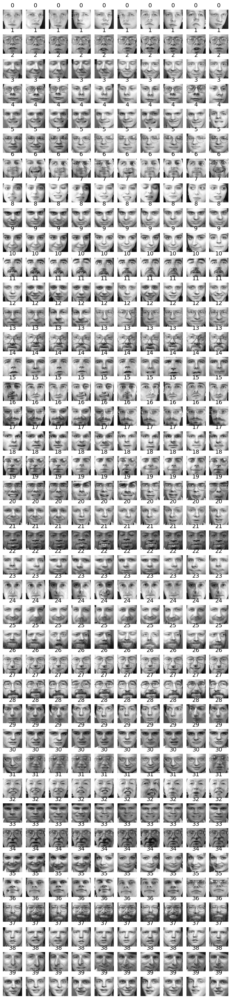

In [247]:
#Apartado 9
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.datasets import fetch_olivetti_faces

olivetti = fetch_olivetti_faces()

from sklearn.model_selection import StratifiedShuffleSplit

def plot_faces(faces, labels, n_cols=5):
    faces = faces.reshape(-1, 64, 64)
    n_rows = (len(faces) - 1) // n_cols + 1
    plt.figure(figsize=(n_cols, n_rows * 1.1))
    for index, (face, label) in enumerate(zip(faces, labels)):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(face, cmap="gray")
        plt.axis("off")
        plt.title(label)
    plt.show()

plot_faces(olivetti.data, olivetti.target, n_cols = 10)

Echémos un vistazo a la descripción del dataset:
 - Dimensión 4096 (muy alta)
 - Características ya normalizadas (se encuentran entre 0 y 1)
 - La etiqueta de cada persona es un número entre 0 y 39

In [248]:
print(olivetti.DESCR)

.. _olivetti_faces_dataset:

The Olivetti faces dataset
--------------------------

`This dataset contains a set of face images`_ taken between April 1992 and 
April 1994 at AT&T Laboratories Cambridge. The
:func:`sklearn.datasets.fetch_olivetti_faces` function is the data
fetching / caching function that downloads the data
archive from AT&T.

.. _This dataset contains a set of face images: https://cam-orl.co.uk/facedatabase.html

As described on the original website:

    There are ten different images of each of 40 distinct subjects. For some
    subjects, the images were taken at different times, varying the lighting,
    facial expressions (open / closed eyes, smiling / not smiling) and facial
    details (glasses / no glasses). All the images were taken against a dark
    homogeneous background with the subjects in an upright, frontal position 
    (with tolerance for some side movement).

**Data Set Characteristics:**

    =================   =====================
    Classes    

\\
Vamos ahora con la **división en train/test** de nuestro dataset:

  En el **muestreo estratificado**, se divide el conjunto de datos en subgrupos o estratos basados en una variable de interés, en nuestro caso la de la clase. Luego, se realiza un muestreo aleatorio en cada estrato o subgrupo de forma proporcional a la distribución de cada clase. Esto garantiza que, aunque el conjunto de datos sea muy pequeño, cada estrato esté representado adecuadamente en la muestra final, de forma que haya el mismo número de imágenes por persona en cada conjunto.


<center><img src=https://scikit-learn.org/stable/_images/sphx_glr_plot_cv_indices_012.png></center>

Imagen extraída de https://scikit-learn.org/stable/modules/cross_validation.html#stratified-shuffle-split

La implementación de *StratifiedShuffleSplit()* en scikit-learn permite especificar el número de iteraciones de la validación cruzada y el tamaño del conjunto de prueba. Durante cada iteración, divide aleatoriamente el conjunto de datos en un conjunto de entrenamiento y otro de prueba, asegurando que la proporción de clases en cada conjunto sea similar a la del conjunto de datos completo. Respecto a los parámetros:

* **n_splits** especifica el número de divisiones de la validación cruzada. Aquí se usa 1 para obtener una sola división.
* **test_size** determina el tamaño del conjunto de prueba, que aquí se establece en 0.2 (20% del conjunto de datos se asignará al conjunto de prueba).

Luego, ***sss.split(X, y)*** genera índices de entrenamiento y test estratificados, que se pueden usar para dividir nuestros datos en conjuntos de entrenamiento y test.

In [249]:
#Vamos con el split
from sklearn.model_selection import StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits= 1, test_size = 0.2, random_state=42)

for train_index, test_index in sss.split(olivetti.data, olivetti.target):
    X_train, X_test = olivetti.data[train_index], olivetti.data[test_index]
    y_train, y_test = olivetti.target[train_index], olivetti.target[test_index]

Veamos de manera intuitiva **cómo se organizan los datos**, pues, en general, los métodos de *clustering* dependen de una manera muy significativa de cómo se reparten o agrupan los datos inicialmente, y una organización muy dispersa o con poco sentido aparente puede afectar drásticamente al rendimiento de modelos de este tipo.

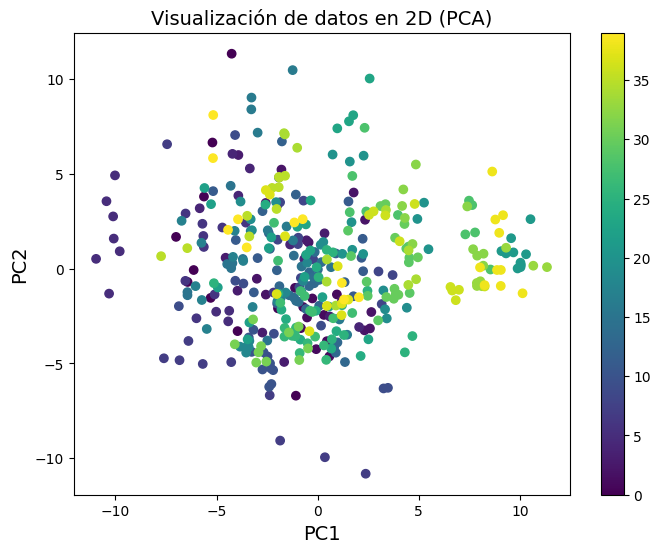

In [250]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(olivetti.data)

df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])

plt.figure(figsize=(8, 6))
plt.scatter(df_pca['PC1'], df_pca['PC2'], c=olivetti.target, cmap='viridis')
plt.title('Visualización de datos en 2D (PCA)')
plt.colorbar()
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()


Aplicamos **reducción de dimensionalidad** para trabajar mejor con el conjunto de características. Ya se explicó en la primera práctica como se hace esto. Usaremos de nuevo PCA().

<Axes: >

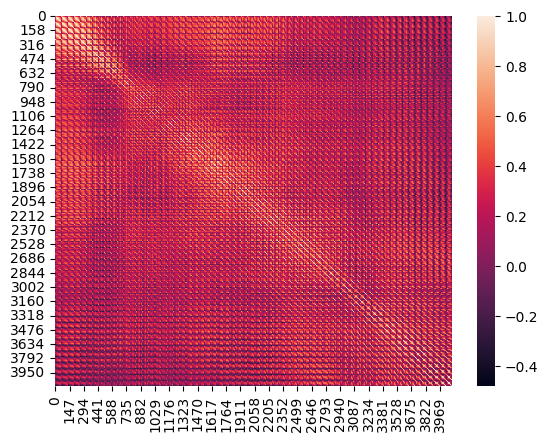

In [251]:
import seaborn as sns
sns.heatmap(np.corrcoef(X_train, rowvar=False))

Vemos que la correlación entre las *features* es media-alta , apliquemos PCA con un 99% de varianza explicada para reducir esto:

In [252]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.99, svd_solver = 'full')

pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

pca.n_components_

222

Nos quedamos con un número de características mucho más razonable para trabajar, 222.

\\
Trabajemos ahora el **número de clústers a utilizar**, como se nos pide en el enunciado. Para ello, vamos a usar el primer enfoque que vimos, es decir, el de imprimir el coeficiente de silueta para cada uno de los *n_clusters* y graficar.

No se ha optado por usar el segundo enfoque (diagrama de silueta) por altos tiempos de ejecución y la comodidad de la salida.

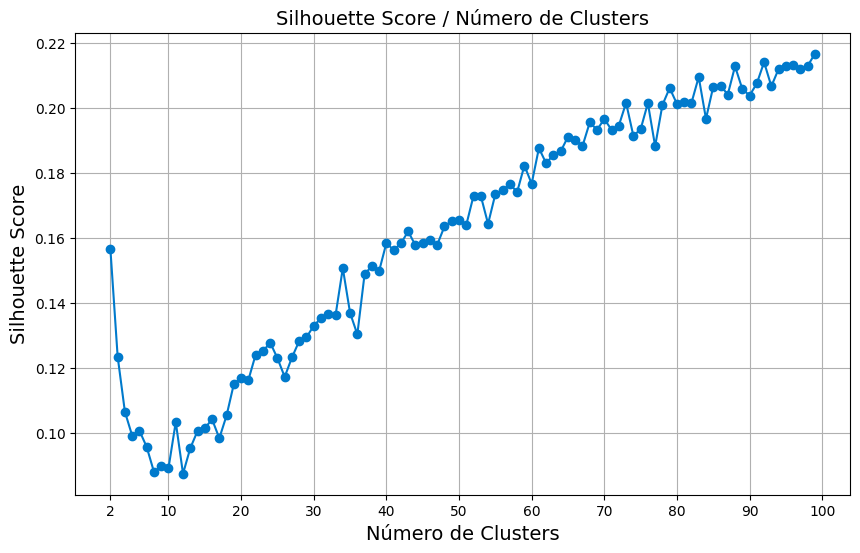

In [253]:
from sklearn.metrics import silhouette_score

rango_clusters = range(2, 100)
silhouette_scores = []

for num_clusters in rango_clusters:

    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
    kmeans.fit(X_train_pca)

    silhouette_scores.append(silhouette_score(X_train_pca, kmeans.labels_))

plt.figure(figsize=(10, 6))
plt.plot(rango_clusters, silhouette_scores, marker='o', color='#007acc')
plt.title('Silhouette Score / Número de Clusters')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.xticks([2,10,20,30,40,50,60,70, 80, 90, 100])
plt.grid(True)
plt.show()

  Vemos que conforme aumentamos el número de clústers, el *score* sigue aumentando y vamos consiguiendo instancias mejor asignadas a clústers. Sin embargo, en este problema, la muestra es de 40 personas, por tanto, tiene poco sentido usar más de 40 clústers, pues queremos como se nos dice en el enunciado: *entrenar un modelo que pueda predecir qué persona está representada en cada imagen*. Es por esto que $K=40$ en nuestro problema de clústering con K-means, cómo el número de personas en nuestro dataset.

In [254]:
k = 40

#Definimos ahora los tres modelos indicados
kmeans1 = KMeans(n_clusters = k, n_init = 10, random_state = 42)
kmeans2 = KMeans(n_clusters = k, init = 'random',  n_init = 1, random_state = 42)
kmeans3 = KMeans(n_clusters = k, init = 'random', n_init = 10, algorithm = 'elkan', random_state = 42)

In [255]:
#Entrenamos los tres modelos y mostramos los clusters
kmeans1.fit(X_train_pca)
kmeans2.fit(X_train_pca)
kmeans3.fit(X_train_pca)

KMeans(algorithm='elkan', init='random', n_clusters=40, n_init=10,
       random_state=42)

Ahora, ya que tenemos nuestros 3 modelos entrenados, vamos a analizar y elegir cuál de ellos consideramos mejor y, una vez elegido, visualizar los clusters y las predicciones que ha hecho. Para ello vamos a usar las diferentes **métricas** explicadas en clase, que miden la calidad de un clustering:

* **Coeficiente de Davies-Bouldin (DB)**: Mide la dispersión dentro de los clusters y la separación entre los clusters. Un valor más bajo indica una mejor partición.

* **Índice de Calinski-Harabasz (CH)**: Calcula la relación entre la dispersión dentro de los clusters y la dispersión entre los clusters. Un valor más alto indica clusters más densos y mejor separados.

Además, incluiremos la **inercia** y el **coeficiente de silueta** para cada uno, ya discutidos anteriormente.

In [256]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

#Evaluamos el primer modelo
inertia1 = kmeans1.inertia_
silhouette1 = silhouette_score(X_train_pca, kmeans1.labels_)
db1 = davies_bouldin_score(X_train_pca, kmeans1.labels_)
ch1 = calinski_harabasz_score(X_train_pca, kmeans1.labels_)

#Evaluamos el segundo modelo
inertia2 = kmeans2.inertia_
silhouette2 = silhouette_score(X_train_pca, kmeans2.labels_)
db2 = davies_bouldin_score(X_train_pca, kmeans2.labels_)
ch2 = calinski_harabasz_score(X_train_pca, kmeans2.labels_)

#Evaluamos el tercer modelo
inertia3 = kmeans3.inertia_
silhouette3 = silhouette_score(X_train_pca, kmeans3.labels_)
db3 = davies_bouldin_score(X_train_pca, kmeans3.labels_)
ch3 = calinski_harabasz_score(X_train_pca, kmeans3.labels_)

print("Modelo 1 -------------")
print("Inercia:", inertia1)
print("Silueta:", silhouette1)
print("DB:", db1)
print("CH:", ch1)
print("\nModelo 2 -------------")
print("Inercia:", inertia2)
print("Silueta:", silhouette2)
print("DB:", db2)
print("CH:", ch2)
print("\nModelo 3 -------------")
print("Inercia:", inertia3)
print("Silueta:", silhouette3)
print("DB:", db3)
print("CH:", ch3)

Modelo 1 -------------
Inercia: 9155.841796875
Silueta: 0.15847039
DB: 1.6812698631537386
CH: 12.331353649894838

Modelo 2 -------------
Inercia: 10183.8974609375
Silueta: 0.109073855
DB: 1.7677852107965726
CH: 10.361749189274358

Modelo 3 -------------
Inercia: 9639.8447265625
Silueta: 0.122535095
DB: 1.7432817770232525
CH: 11.35173882672094


>Comparamos en *train* pues no es buena práctica comparar resultados en *test*

\\
**Análisis de las métricas:** El mejor modelo será aquel que tenga la menor inercia, el mayor valor de silueta, el menor valor de DB y el mayor valor de CH, o, al menos, el que elegiremos como mejor.

El **modelo 1 (kmeans1)** cumple con estas cuatro restricciones. Es el que elegiremos para visualizar los clusters. En resumen, tiene la menor inercia, lo cual indica que los **clusters son más compactos**, tiene el mayor valor de silueta, lo cual sugiere que los **clusters están bien definidos y separados**, tiene el menor valor de DB, lo que indica que hay una **buena separación entre los clusters** y una **alta cohesión o baja variabilidad dentro de cada cluster**; y tiene el mayor valor de CH, lo que indica que los **clusters son densos y bien separados**.



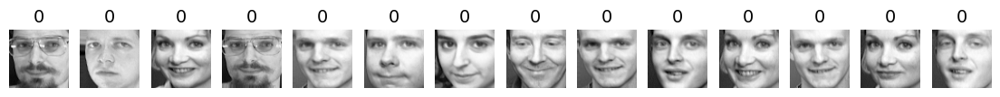

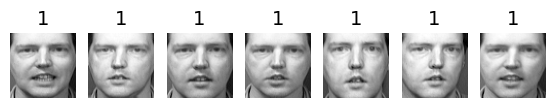

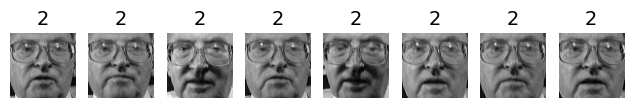

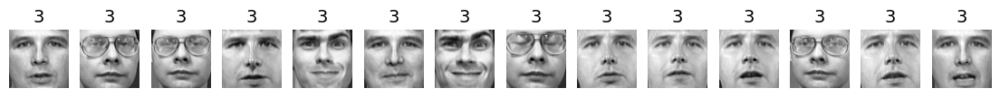

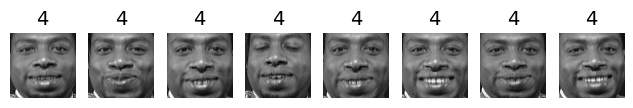

...

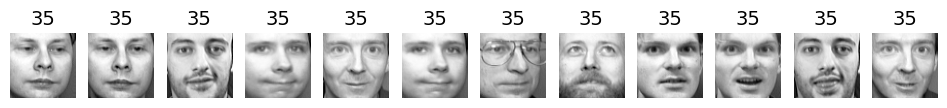

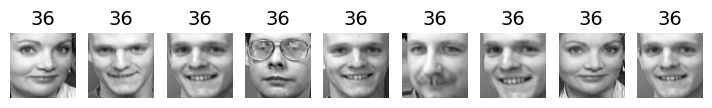

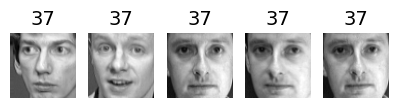

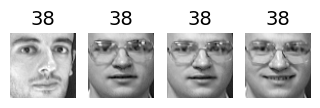

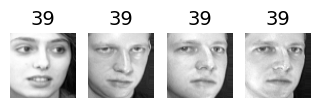

In [257]:
#Clusters para el primer modelo en entrenamiento
for cluster_id in np.unique(kmeans1.labels_):
    in_cluster = kmeans1.labels_== cluster_id
    faces = X_train[in_cluster]

    plot_faces(faces, [cluster_id] * len(faces) , n_cols = 15)

Veamos ahora **como predice** el modelo, es decir, como generaliza para nuestro conjunto de test, y veamos los clusters obtenidos como hemos hecho para el conjunto de test:

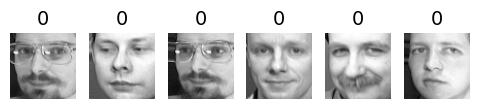

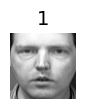

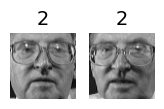

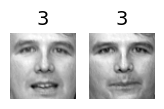

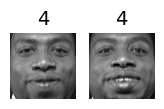

...

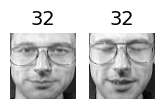

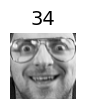

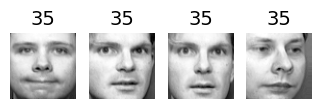

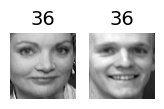

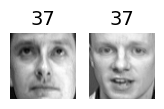

In [258]:
#Clusters para el primer modelo
labels_test_1 = kmeans1.predict(X_test_pca)

for cluster_id in np.unique(labels_test_1):
    in_cluster = labels_test_1 == cluster_id
    faces = X_test[in_cluster]
    plot_faces(faces, [cluster_id] * len(faces) , n_cols = 10)

In [259]:
silhouette1 = silhouette_score(X_test_pca, labels_test_1)
db1 = davies_bouldin_score(X_test_pca, labels_test_1 )
ch1 = calinski_harabasz_score(X_test_pca, labels_test_1)

print("Modelo 1 (test) ------")
print("Silueta:", silhouette1)
print("DB:", db1)
print("CH:", ch1)

Modelo 1 (test) ------
Silueta: 0.06405036
DB: 1.179166082656092
CH: 4.147503139761937


Aparentemente y visualmente, aunque hay ciertos clústers que contienen imágenes de distintas personas, considero que K-means ha hecho un buen trabajo y ha sabido distinguir caras similares. Sin embargo, si atendemos únicamente a las métricas mostradas, los resultados son bastante pobres.

Esto lo podríamos ligar a los **pocos datos de los que disponemos**, pues 400 instancias son pocas, más aún si restringimos a nuestro conjunto de entrenamiento. Además, es bastante visible en este problema la importancia de conocer bien nuestro dataset y cómo se distribuyen los datos en nuestro dataset, así como la dimensión de las muestras...etc. El contraste se encuentra en que **si no contasemos con las etiquetas proporcionadas** por el dataset, no sabríamos si estamos agrupando bien, pues visualmente podríamos pensar que sí, sin embargo los números nos dicen otra cosa.

En resumen, en el aprendizaje no supervisado estamos demasiado expuestos al desconocimiento de la distribución de los datos y debemos ser más cautelosos, así como, en general, esperar peores resultados que en el aprendizaje supervisado. Además, cuando tratamos con un problema de clústering, es muy importante hacernos una idea de cómo se distribuyen nuestros datos, qué valores toman y en qué dominio, así como visualizar las muestras, que nos puede dar información muy valiosa.

### <font color='blue'>Ejercicio 1.B: Utilización de DBSCAN (1 punto)</font>

<font color='blue'> En este ejercicio haremos algo similar a lo realizado en el anterior, pero ahora con otro problema sintético en 2D y el algoritmo DBSCAN. Para crear el conjunto sintético haremos uso de la función `make_moons` dentro del paquete de `sklearn.datasets`. Crearemos un conjunto sintético de $1.000$ puntos con una tasa de ruido de $0.05$.


<font color='blue'> Las tareas a realizar a realizar en este ejercicio se resumen a continuación:
1. A partir del conjunto de datos especificado, ajusta un algoritmo DBSCAN con los hiperparámetros por defecto (5 mínimas muestras por cluster). Identifica los índices de los ejemplos núcleo (_core points_)) e imprime sus coordenadas. Para ello, emplea las variables de instancia `core_sample_indices_` y `components_`, respectivamente.
2. La variable de instancia `labels_` contiene el núcleo al que pertenece cada ejemplo
del conjunto de datos. Observa que algunas instancias tienen un índice de cluster
igual a -1, lo que significa que el algoritmo las considera anomalías. En un conjunto
sencillo como este, en un principio, no debería haber anomalías. El hiperparámetro `eps` indica la distancia
máxima entre dos muestras para que una se considere vecina de la otra (no se trata de un
límite máximo de las distancias de los puntos dentro de un cluster). Es el hiperparámetro
de DBSCAN más importante que debes elegir adecuadamente para tu conjunto de datos y
función de distancia. Ajusta 4 modelos de DBSCAN con el hiperparámetro $eps$ igual a
$\{0.01,0.02,0.05,0.1\}$. Dibuja una representación de los clústers para cada modelo
identificando las anomalías que tiene en el gráfico y dando el porcentaje de anomalías
de cada modelo. Analiza y explica los resultados obtenidos.
3. Sorprendentemente, la clase DBSCAN no tiene un método `predict()`,
aunque sí tiene un método `fit_predict()`. En otras palabras, no puede predecir
a qué cluster pertenece una nueva instancia. Esta decisión se tomó porque diferentes
algoritmos de clasificación pueden ser mejores para diferentes tareas, por lo que los
autores decidieron dejar que el usuario eligiera cuál utilizar. Pero sí se puede usar
un clasificador para ver en qué cluster está cada punto nuevo. Hazlo con un clasificador
kNN con un vecindario de 30 vecinos, usando el mejor modelo del apartado anterior y utilizando como
ejemplos de entrenamiento los _core points_ encontrados y como etiquetas (salidas deseadas) las `labels_` obtenidas. Obtén el cluster asociado y la probabilidad para los
siguientes 4 ejemplos `[[-0.5, 0], [0, 0.5], [1, -0.1], [2, 1]]`.
Junto con lo anterior, dibuja un gráfico que represente los bordes de decisión y aplica también k-means sobre los mismo datos. Analiza las diferencias entre dichas fronteras de decisión en base al funcionamiento y naturaleza de los dos algoritmos subyacentes.
    
<font color='blue'> El alumnado debe describir en detalle el trabajo realizado y las conclusiones extraídas.



---



Antes de comenzar con el apartado, vamos a analizar y comentar **cómo funciona** DBSCAN. De nuevo, tratamos con un problema de *clustering*, pero vamos a usar un algoritmo diferente, que ahora en lugar de trabajar con distancias lo hace con **densidades**. Es la clave de DBSCAN.

**¿Cómo funciona?**

 1. Se recorren todas las instancias y se cuenta cuántas instancias están a $\epsilon$ de ello (hiperparámetro) y se definen **vecindades**
 2. Si una de ellas tiene al menos min_muestras vecinas, lo consideraremos instancia central o *core point* **texto en negrita**
 3. Todas aquellas vecinas de un *core point* pertenecen al mismo clúster
 4. Si una instancia no es central y no tiene ninguna otra instancia en su vecindad es una **anomalía**

In [260]:
#Funcionamiento de DBSCAN
from IPython.display import Image
Image(url='https://anderfernandez.com/wp-content/uploads/2022/03/dbscan_portada.gif')

#Imagen extraída de https://anderfernandez.com/blog/dbscan-python/

>En este ejemplo, aquellas instancias que no se colorean se consideran anomalías

La **densidad** de los datos puede variar significativamente dentro de un conjunto de datos. Algunas áreas pueden contener muchos puntos cercanos entre sí, mientras que otras áreas pueden ser más dispersas. Esta variabilidad en la densidad puede surgir debido a varias razones, como la naturaleza de los datos, la escala de las características o incluso la **presencia de ruido**.

DBSCAN se basa en la noción de que los clústeres en los datos se caracterizan por regiones de alta densidad que **están separadas por regiones de baja densidad**. Al identificar áreas de alta densidad y agrupar puntos dentro de estas áreas, DBSCAN puede encontrar clústeres de diferentes formas y tamaños en conjuntos de datos con distribuciones de densidad variables.

##### **Apartado 1**

Vamos a usar los hiperparámetros por defecto, donde un clúster será tal si contiene 5 muestras y **$\epsilon$** (distancia de vecindad) será **0.5**.

También por defecto se emplea la distancia euclídea.

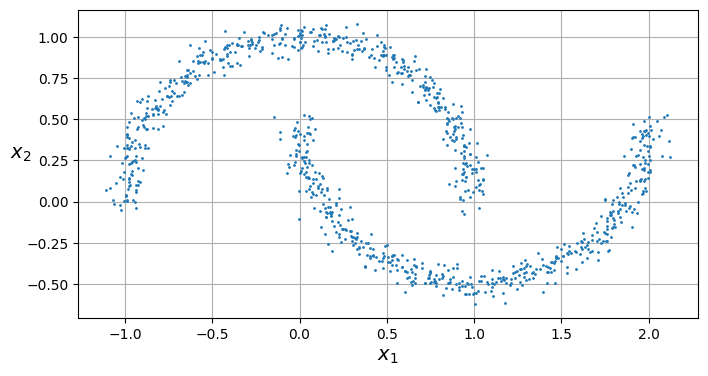

In [261]:
#Apartado 1
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=1000, noise=0.05, random_state=42)

plt.figure(figsize=(8, 4))
plot_clusters(X)
plt.gca().set_axisbelow(True)
plt.grid()
plt.show()

In [262]:
dbs = DBSCAN()

dbs.fit(X)

core_indices = dbs.core_sample_indices_
core_points = X[core_indices]
##Es lo mismo que hacer
# core_points = dbs_components_

print("Hay ", len(dbs.components_), " instancias centrales o core points")
print("Coordenadas de los core points:")
for point in dbs.components_:
    print(point)

Hay  1000  instancias centrales o core points
Coordenadas de los core points:
[-0.02137124  0.40618608]
[ 0.97670045 -0.45832306]
[ 0.90405882 -0.37651952]
[ 0.37736316 -0.39703717]
[-0.84192557  0.53058695]
[ 0.58930337 -0.32137599]
[ 0.29248724 -0.20696309]
[-0.02637836  0.44766267]
[ 1.6201408  -0.28758856]
[0.68246733 0.80712069]
[ 1.26718285 -0.40793471]
[0.87418608 0.50781041]
[ 0.3322007  -0.19032202]
[1.952812   0.22552333]
[1.9797373 0.0831513]
[ 1.72926364 -0.08800079]
[-0.20280226  1.02277576]
[ 1.7895881  -0.16231967]
[ 1.0280974 -0.4830331]
[-0.41546771  0.93423658]
[0.00346747 0.17635817]
[0.48310182 0.95150758]
[-0.64419537  0.72552881]
[-0.00995689  0.3510225 ]
[0.19155835 0.92838729]
[0.16665059 1.0159378 ]
[0.78717693 0.63533742]
[2.06100131 0.39601437]
[ 1.79788194 -0.10106546]
[1.99508048 0.22711421]
[-0.50155625  0.87148353]
[0.55929923 0.78166414]
[ 0.22347836 -0.21586279]
[-0.99147029  0.04177827]
[-0.73247801  0.60953553]
[0.32760792 1.08007409]
[ 0.60644731 -0.

En la primera línea de la salida, he impreso el número de *core points* que ha resultado de entrenar DBSCAN con sus hiperparámetros por defecto. Resulta que coge **todas** las muestras y las toma con *core_points*, y esto se debe a que se encuentra en un rango de valores de $[-1,2]$ para el eje X y de $[-1,1]$ para el eje Y aproximadamente.

Como la distancia la hemos dejado en $0.5$, y tenemos 1000 muestras, con una densidad baja entre ellas en general, todos los puntos los podemos considerar como instancias centrales, pues siempre encontramos *min_samples = 5* instancias alrededor de la instancias analizada.

Importante darse cuenta de cómo reluce en este ejemplo la importancia de explorar los parámetros de los modelos que entrenemos y de conocer bien qué cambia cada uno y cómo podemos conseguir un rendimiento óptimo. En el siguiente apartado nos centramos en esto mismo.

#####**Apartado 2**

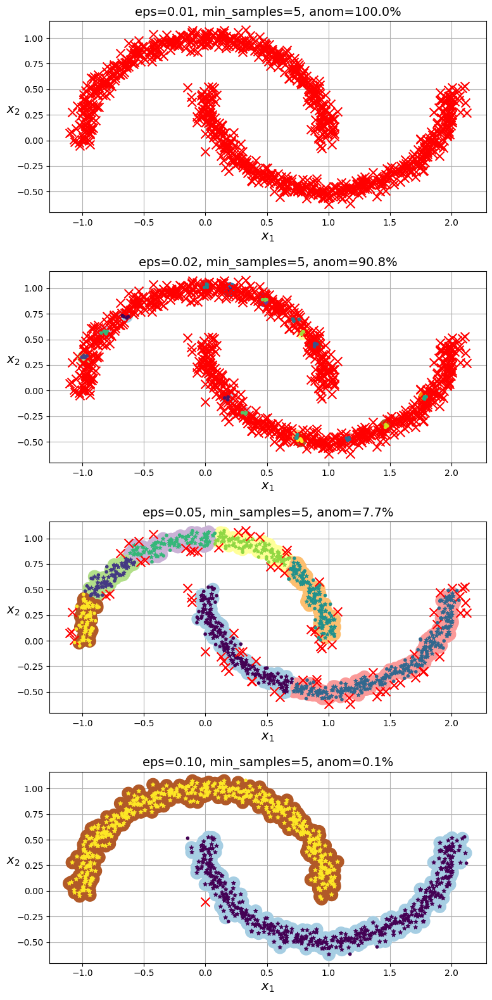

In [263]:
#Apartado 2
import collections

def plot_dbscan(dbscan, X, size, show_xlabels=True, show_ylabels=True, anom_rate = 0):
    core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = dbscan.labels_ == -1
    non_core_mask = ~(core_mask | anomalies_mask)

    cores = dbscan.components_
    anomalies = X[anomalies_mask]
    non_cores = X[non_core_mask]

    plt.scatter(cores[:, 0], cores[:, 1],
                c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    plt.scatter(cores[:, 0], cores[:, 1], marker='*', s=20,
                c=dbscan.labels_[core_mask])
    plt.scatter(anomalies[:, 0], anomalies[:, 1],
                c="r", marker="x", s=100)
    plt.scatter(non_cores[:, 0], non_cores[:, 1],
                c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title(f"eps={dbscan.eps:.2f}, min_samples={dbscan.min_samples}, anom={anom_rate}%")
    plt.grid()
    plt.gca().set_axisbelow(True)

epsilon = [0.01,0.02,0.05,0.1]

fig, axs = plt.subplots(len(epsilon), 1, figsize=(8, 4 * len(epsilon)))

#En el bucle recorremos las distintas combinaciones de eps
for i, e in enumerate(epsilon):
  #Creamos un nuevo modelo DBSCAN para e dentro de epsilon
  dbs = DBSCAN(eps=e)
  dbs.fit(X)
  counts = collections.Counter(dbs.labels_)[-1]
  rate = counts/1000 * 100

  plt.subplot(len(epsilon), 1, i + 1)
  plot_dbscan(dbs, X, 200, anom_rate = rate)  # Pasamos el eje específico


print("\n")
plt.tight_layout()
plt.show()


A la vista está la importancia del hiperparámetro ***eps***, pues el resultado es completamente diferente de un modelo a otro. Analicémoslo:
 - Para **eps = 0.01** obtenemos un porcentaje de anomalías del 100%, es decir, DBSCAN no ha sabido encontrar ningún *core point* que tenga 5 vecinos (pues hemos escogido una distancia demasiado baja) y por tanto **no encuentra ningún clúster**.
 - Para **eps = 0.02**, es capaz de encontrar algún clúster, pero el *rate* de anomalías sigue siendo demasiado grande.
 - Para **eps = 0.05** nos vamos acercando a una solución mejor, pues encuentra un total de 7 clústers bastante poblados.
 - Para **eps = 0.1** encontramos una solución mucho mejor, pues agrupa los dos clústers que visualmente y aparentemente son los correctos.

Es un hiperparámetro **crítico** pues afecta total y estructuralmente a los clústers encontrados, así como a las anomalías detectadas. Se ha de encontrar un buen valor para él de manera que se ajuste bien a las densidades de las instancias pero que también nos ayude identificar las anomalías. En nuestro ejemplo sintético esto se aprecia muy bien pues sabemos de antemano que no hay anomalías, añadimos muy poco ruido y al crear los datos se hace de manera que están agrupados.

Por eso, para **eps = 0.1** econtramos una mucho mejor solución del modelo, pues el porcentaje de anomalías es únicamente de 0.1%.

#####**Apartado 3**

In [264]:
#Apartado 3
from sklearn.neighbors import KNeighborsClassifier

clf = KNeighborsClassifier(n_neighbors=30)
clf.fit(dbs.components_, dbs.labels_[dbs.core_sample_indices_])

#Puntos a predecir dados en el enunciado
predecir = np.array([[-0.5, 0], [0, 0.5], [1, -0.1], [2, 1]])

#La función predict_proba de knn nos da la probabilidad de pertenecer a cada clúster
print("Número de clusters: ", len(clf.predict_proba(predecir)[0]))
print("Clústers asignados: ", clf.predict(predecir))
print("Probabilidad para cada uno de los clústers/puntos:\n", clf.predict_proba(predecir))


Número de clusters:  2
Clústers asignados:  [1 0 1 0]
Probabilidad para cada uno de los clústers/puntos:
 [[0.1 0.9]
 [1.  0. ]
 [0.  1. ]
 [1.  0. ]]


Mostramos ahora dónde se ubicand dichos puntos en la frontera de decisión para DBSCAN:


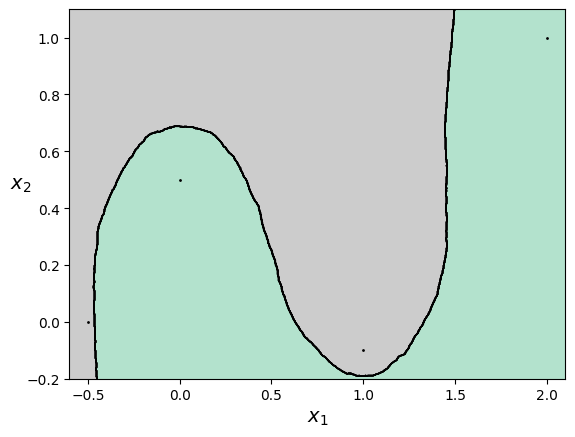

In [265]:
plot_decision_boundaries(clf, predecir, show_centroids=False)

Es interesante recalcar, que como se hace en *Hands-on Machine Learning with Scikit Learn Keras and TensorFlow* *(Géron, 2019, p. 258)*, se han de tener en cuenta **si estas nuevas instancias se consideran o no anomalías** (por DBSCAN), pues KNN no lo hace por sí solo. Para ello, podemos definir una distancia, para la cual si la nueva instancia se encuentra más lejos que esta de ambos clústers, la consideraremos una anomalía. Veamos cómo se hace esto, usando *kneighbors()*, que dado un conjunto de instancias, devuelve las distancias e índices de los k vecinos más cercanos:

In [266]:
y_dist, y_pred_idx = clf.kneighbors(X_new, n_neighbors=1)
y_pred = dbs.labels_[dbs.core_sample_indices_][y_pred_idx]
y_pred[y_dist > 0.2] = -1
y_pred

array([[-1],
       [-1],
       [-1],
       [-1]])

Por tanto, todas las nuevas son instancias anómalas. Vamos ahora con la frontera de decisión para KNN:

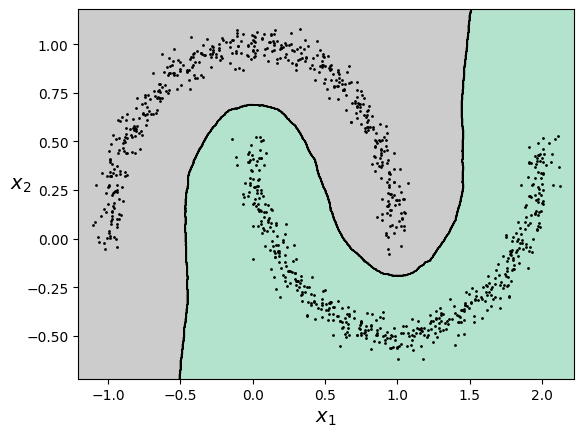

In [267]:
plot_decision_boundaries(clf, X, show_centroids=False)

Vemos que conseguimos unas fronteras bastante coherentes, al menos visualmente, pues sabemos cómo hemos creado los datos y que seguramente estas dos de aquí arriba sean las agrupaciones correctas. Parece que es un **buen enfoque** usar DBSCAN y luego terminar con la clasificación KNN.

''

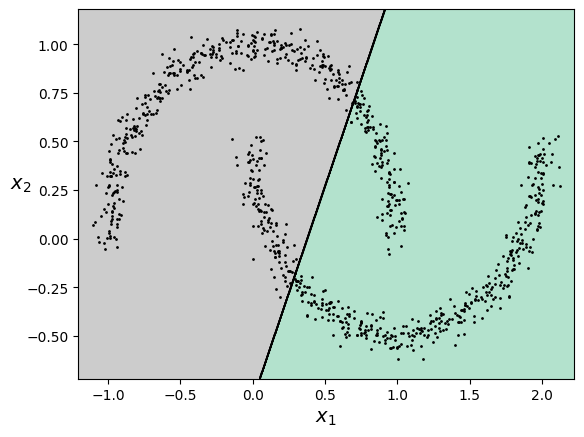

In [268]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 2, n_init = 10, random_state = 42)
kmeans.fit(X)

plot_decision_boundaries(kmeans, X, show_centroids=False)
;

**Comparamos con k-means**: Vemos como para este caso k-means no funciona como nosotros querríamos. Lo que está pasando es que K-means **al operar con distancias** está tomando los puntos centrales de la imagen como muy parecidos entre ellos y no está teniendo en cuenta la **densidad**, como hace DBSCAN. Es una de las limitaciones que tiene K-means, pues no puede enfrentarse bien a todos los problemas. Por ello surgen opciones como DBSCAN y otros métodos de clústering que tienen en cuenta otras métricas u otros enfoques para realizar los agrupamientos de datos.

Como resumen, **DBSCAN** es adecuado para detectar estructuras de clústeres con formas arbitrarias y densidades variables. Cuando se combina con un clasificador como KNN, puede proporcionar bordes de decisión precisos y ajustados a la verdadera distribución de los datos.

**KMeans** es más adecuado para datos que forman clústeres convexos y forma más ordinarias. En casos de estructuras más complejas, como la anterior, KMeans no capturará correctamente la verdadera forma de los clústeres, resultando en fronteras de decisión menos precisas.

## <font color='blue'>Ejercicio 2: PROBLEMA DE AGRUPAMIENTO (5 puntos)</font>

<font color='blue'> Para la realización de este ejercicio, se ha seleccionado el dataset denominado "Anuran Calls (MFCCs)" [1] (https://archive.ics.uci.edu/dataset/406/anuran+calls+mfccs). Este conjunto de datos describe las características sonoras de los cantos de diferentes especies de anfibios del orden Anura, cuyos integrantes coloquialmente son conocidos como ranas o sapos.

<font color='blue'> Se encuentran representados por medio de los coeficientes cepstrales en las frecuencias de Mel ([_Mel-frequency cepstral coefficients_](https://en.wikipedia.org/wiki/Mel-frequency_cepstrum), MFCCs), que son en esencia, una representación abstracta de una señal de audio obtenida al aplicar una transformada del coseno discreta a un espectrograma de Mel, es decir, una representación  de las frecuencias auditivas que son capaces de captar los humanos. Debido a ser una representación compacta del [espectrograma](https://en.wikipedia.org/wiki/Spectrogram), manteniendo las características más importantes del audio, se utiliza de forma regular en procesado del habla y aplicaciones de aprendizaje automático en procesado de señales de audio [2].

<font color='blue'> El dataset, creado por investigadores de la Universidad Federal del Amazonas en Brasil, contiene individuos de 10 especies, también incluyéndose su género y familia taxonómica, con el objetivo original de lograr realizar una clasificación multiclase de las especies de anuros que fueron grabados en los terrenos de la Universidad, así como de Mata atlántica (Brasil) y Córdoba (Argentina) en condiciones reales, es decir, con ruido de fondo.
    
<font color='blue'> Este conjunto de datos se utilizó en varias tareas de clasificación relacionadas con el reto del reconocimiento de especies de anuros a través de sus llamadas. Se trata de un conjunto de datos multietiqueta con tres columnas de etiquetas. Este conjunto de datos se creó segmentando 60 registros de audio pertenecientes a 4 familias diferentes, 8 géneros y 10 especies. Cada audio corresponde a un espécimen (una rana individual), el ID del registro también se incluye como columna adicional. Se utilizaron la entropía espectral y un método de cluster binario para detectar los fragmentos de audio pertenecientes a cada sonido. La segmentación y la extracción de características se realizaron en Matlab. Tras la segmentación se obtuvieron 7195 sílabas, que se convirtieron en instancias para entrenar y probar el clasificador.

<font color='blue'> Resulta entonces interesante saber si las clasificaciones taxonómicas realizadas tienen sentido en cuanto a los datos, es decir, ¿realmente se corresponden de cierta forma los distintos cantos de los anuros con la clasificación que poseen actualmente? ¿O existen especies que, siendo de diferentes grupos taxonómicos, poseen un canto indistinguible?

### <font color='blue'> Objetivos
    
<font color='blue'> El objetivo del presente trabajo es analizar los patrones de los datos, sin tomar en cuenta su _ground truth_, para determinar si la clasificación taxonómica actual corresponde razonablemente con una diferencia en los cantos. Claro está que este estudio representará un análisis superficial del problema, pero al menos sí podrá servir de base para estudiar si podemos determinar una taxonomía aproximada de los anuros.

<font color='blue'> Para llevar a cabo este objetivo principal se llevarán a cabo los siguientes objetivos secundarios:
1. <font color='blue'> Realización de un análisis exploratorio de los datos para una primera observación de las distribuciones de los cantos.
2. Detección y eliminación de _outliers_ así como las transformaciones necesarias para que los datos sean lo más "correctos" para los métodos de _clustering_.
4. Experimentación y determinación de los algoritmos y métricas intrínsecas más acordes a los datos. El alumnado debe experimentar con, al menos, dos algoritmos diferentes de _clustering_.

### <font color='blue'> Hipótesis
<font color='blue'>Sobre los datos se pueden realizar las siguientes hipótesis:
- <font color='blue'>Los datos, siendo grabaciones que incluyen el ruido de fondo, poseerán una cantidad significativa de _outliers_.
- <font color='blue'>Será posible, al menos en parte, observar cierta "agrupación" en los datos a simple vista.
- <font color='blue'>Existirá cierta correlación entre los _MFCCs_ debido a que provienen de una misma grabación, por lo que ciertas columnas/características crecerán o disminuirán de forma conjunta. En otras palabras, como el dispositivo empleado para adquirir sonidos es el mismo para todas las pistas de audio (7195), es razonable pensar que si algún _MFCC_ presenta algún problema, o atenuación de algún tipo, dicha particularidad podrá estar presente en todas las instancias/observaciones.  

### <font color='blue'> Resultados Esperados
<font color='blue'> Se espera que los resultados que se obtengan del clustering sean razonablemente parecidos a la realidad. Es decir, se espera que el agrupamiento encontrado tenga algún tipo de relación con alguna de las últimas 4 columnas de los datos (_Family_, _Genus_, _Species_ o _RecordID_).

### <font color='blue'> Bibliografía

<font color='blue'><font color='blue'>[1] E. N. Juan Colonna, “Anuran Calls (MFCCs).” UCI Machine Learning Repository, 2015. doi: 10.24432/C5CC9H. https://archive.ics.uci.edu/dataset/406/anuran+calls+mfccs

<font color='blue'>[2] “3.8. The cepstrum, mel-cepstrum and mel-frequency cepstral coefficients (MFCCs) — Introduction to Speech Processing.” Accessed: Jan. 13, 2024. [Online]. Available: https://speechprocessingbook.aalto.fi/Representations/Melcepstrum.html#the-cepstrum




In [269]:
#Para acceder a nuestros ficheros de Google Drive
from google.colab import drive
drive.mount('/content/drive')
# La carpeta 'clasificacion' (que contiene optdigits.tes, optdigits.tra, optdigits.names)
# debe estar en vuestro Drive, dentro de la carpeta 'Colab Notebooks'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [270]:
dataFolder = 'drive/MyDrive/Colab Notebooks/clustering/'

In [271]:
import pandas as pd
import numpy as np
df_frogs = pd.read_csv(dataFolder + "Frogs_MFCCs.csv")
df_frogs

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family,Genus,Species,RecordID
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,Leptodactylidae,Adenomera,AdenomeraAndre,1
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,Leptodactylidae,Adenomera,AdenomeraAndre,1
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,Leptodactylidae,Adenomera,AdenomeraAndre,1
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,Leptodactylidae,Adenomera,AdenomeraAndre,1
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,Leptodactylidae,Adenomera,AdenomeraAndre,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7190,1.0,-0.554504,-0.337717,0.035533,0.034511,0.443451,0.093889,-0.100753,0.037087,0.081075,...,0.069430,0.071001,0.021591,0.052449,-0.021860,-0.079860,Hylidae,Scinax,ScinaxRuber,60
7191,1.0,-0.517273,-0.370574,0.030673,0.068097,0.402890,0.096628,-0.116460,0.063727,0.089034,...,0.061127,0.068978,0.017745,0.046461,-0.015418,-0.101892,Hylidae,Scinax,ScinaxRuber,60
7192,1.0,-0.582557,-0.343237,0.029468,0.064179,0.385596,0.114905,-0.103317,0.070370,0.081317,...,0.082474,0.077771,-0.009688,0.027834,-0.000531,-0.080425,Hylidae,Scinax,ScinaxRuber,60
7193,1.0,-0.519497,-0.307553,-0.004922,0.072865,0.377131,0.086866,-0.115799,0.056979,0.089316,...,0.051796,0.069073,0.017963,0.041803,-0.027911,-0.096895,Hylidae,Scinax,ScinaxRuber,60


#####**Análisis exploratorio de los datos**

En un primer vistazo a la tabla anterior, podemos observar varias cosas:
 - Como se nos decía, hay algunas variables que seguramente estén correladas y de hecho, la *feature* 1 sólo tiene el valor 1 (podemos interpretar cualquier otra característica como ella misma multiplicada por la 1).
 - Además de las 22 características por muestra, podemos ver a qué familia, género, especie e ID tiene cada una de las muestras, veámoslo:

In [272]:
familia = df_frogs['Family'].unique()
genero = df_frogs['Genus'].unique()
especie = df_frogs['Species'].unique()
id = df_frogs['RecordID'].unique()

print(familia, familia.size)
print(genero, genero.size)
print(especie, especie.size)
print(id, id.size)

['Leptodactylidae' 'Dendrobatidae' 'Hylidae' 'Bufonidae'] 4
['Adenomera' 'Ameerega' 'Dendropsophus' 'Hypsiboas' 'Leptodactylus'
 'Osteocephalus' 'Rhinella' 'Scinax'] 8
['AdenomeraAndre' 'Ameeregatrivittata' 'AdenomeraHylaedactylus'
 'HylaMinuta' 'HypsiboasCinerascens' 'HypsiboasCordobae'
 'LeptodactylusFuscus' 'OsteocephalusOophagus' 'Rhinellagranulosa'
 'ScinaxRuber'] 10
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60] 60


Hay 4 familias, 8 géneros distintos, 10 especies y hasta 60 id's distintos de grabaciones. Cada audio o grabación se corresponde con un especimen individual, de ahí el ID. Veamos un poco de información general del dataset:

In [273]:
df_frogs.describe()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,RecordID
count,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,...,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000
mean,0.989885,0.323584,0.311224,0.445997,0.127046,0.097939,-0.001397,-0.000370,0.128213,0.055998,...,-0.039244,-0.101748,0.042062,0.088680,0.007755,-0.049474,-0.053244,0.037313,0.087567,25.220014
std,0.069016,0.218653,0.263527,0.160328,0.162722,0.120412,0.171404,0.116302,0.179008,0.127099,...,0.152515,0.187618,0.119915,0.138055,0.084733,0.082546,0.094181,0.079470,0.123442,13.214399
min,-0.251179,-0.673025,-0.436028,-0.472676,-0.636012,-0.410417,-0.538982,-0.576506,-0.587313,-0.952266,...,-0.590380,-0.717156,-0.498675,-0.421480,-0.759322,-0.680745,-0.361649,-0.430812,-0.379304,1.000000
25%,1.000000,0.165945,0.138445,0.336737,0.051717,0.012581,-0.125737,-0.063109,0.004648,-0.001132,...,-0.132980,-0.255929,-0.019549,-0.001764,-0.042122,-0.106079,-0.120971,-0.017620,0.000533,15.000000
50%,1.000000,0.302184,0.274626,0.481463,0.161361,0.072079,-0.052630,0.013265,0.189317,0.063478,...,-0.050715,-0.143259,0.041081,0.112769,0.011820,-0.052626,-0.055180,0.031274,0.105373,22.000000
75%,1.000000,0.466566,0.430695,0.559861,0.222592,0.175957,0.085580,0.075108,0.265395,0.117725,...,0.039157,0.017348,0.107046,0.201932,0.061889,0.006321,0.001342,0.089619,0.194819,37.000000
max,1.000000,1.000000,1.000000,1.000000,0.752246,0.964240,1.000000,0.551762,0.738033,0.522768,...,0.575749,0.668924,0.670700,0.681157,0.614064,0.574209,0.467831,0.389797,0.432207,60.000000


Pero esta información así, tampoco nos aporta demasiado, si bien es cierto que ahora conocemos más o menos en qué rangos se mueven las características y que seguramente, tendremos que escalar los datos.

Visualicemos ahora las 4 **familias** para ver si existe un desbalanceo de los datos:

<Axes: xlabel='Family', ylabel='count'>

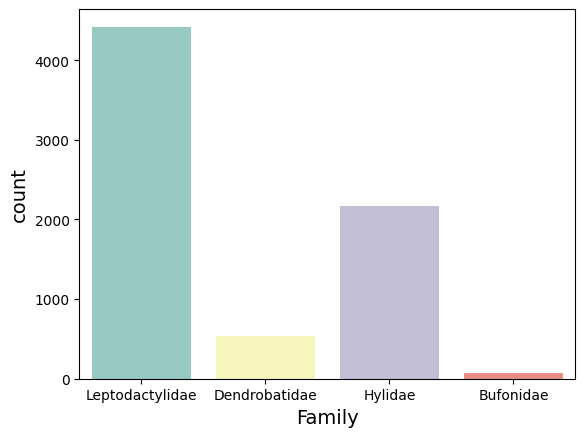

In [274]:
import seaborn as sns

sns.countplot(x = 'Family', hue = 'Family', data = df_frogs, palette= 'Set3', legend = False)

La cantidad de inidividuos dentro de las 4 familias es bastante bajo, pues tenemos muy pocas muestras para *Bufonidae* y *Dentrobatidae*.

En principio esto no va a suponer problema, pues trabajaremos justo para intentar agrupar esas especies por familia, especie, género... Cualquiera es válida pues estamos ante un problema de clustering.

In [275]:
df_frogs['Family'].value_counts()

Family
Leptodactylidae    4420
Hylidae            2165
Dendrobatidae       542
Bufonidae            68
Name: count, dtype: int64

Podemos ahora hacer el mismo análisis para el **género** ahora:

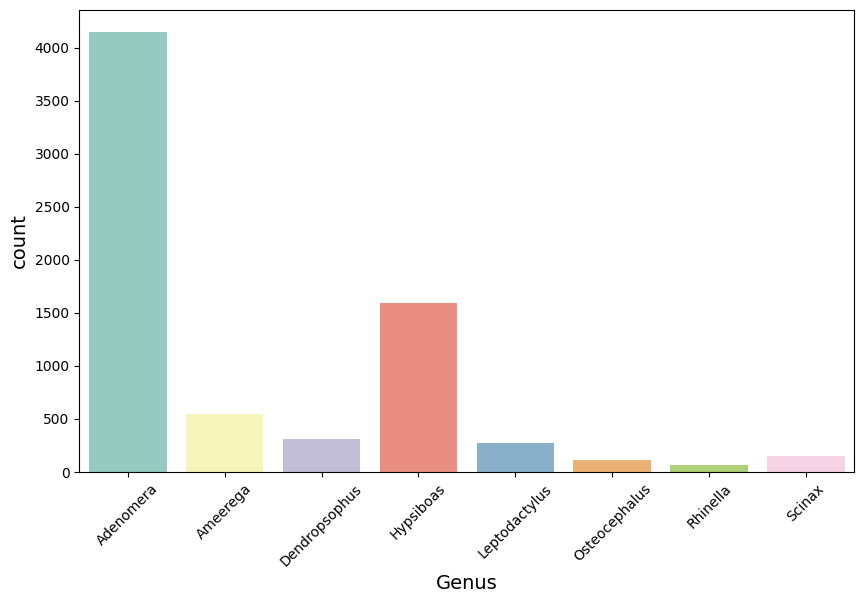

In [276]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.countplot(x='Genus', hue = 'Genus', data=df_frogs, palette='Set3')
plt.xticks(rotation=45)

plt.show()

Y por último lo podemos hacer por **especie**, para tener una idea más general de los 3 grupos:

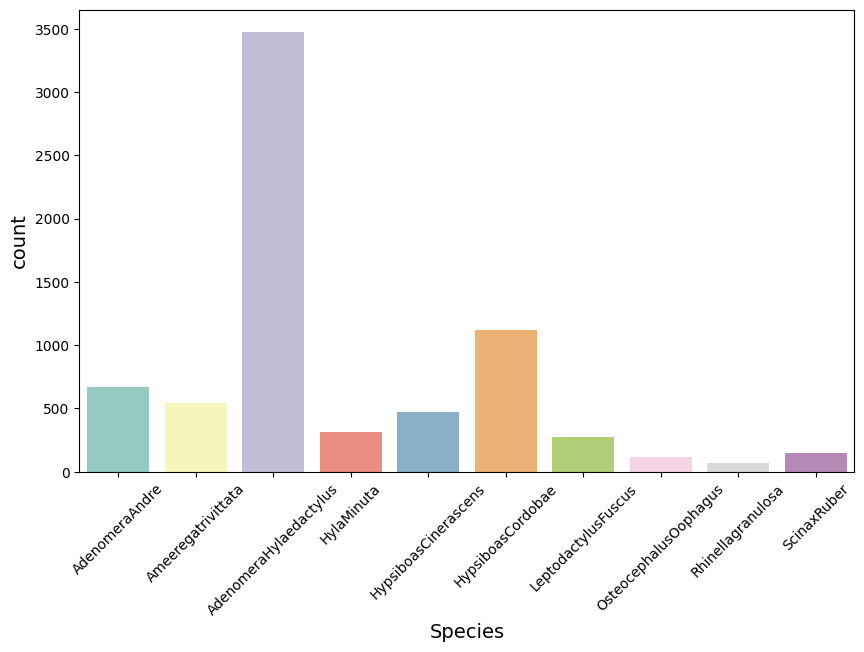

In [277]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Species', hue = 'Species', data=df_frogs, palette='Set3')
plt.xticks(rotation=45)

plt.show()

Por último, visualicemos el número de muestras identificadas por su ***RecordID***, es decir, son el mismo espécimen individual grabado varias veces. Este va de 1 a 60:

<ipython-input-278-0723972b66ee>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='RecordID', data=df_frogs, palette='Set3')


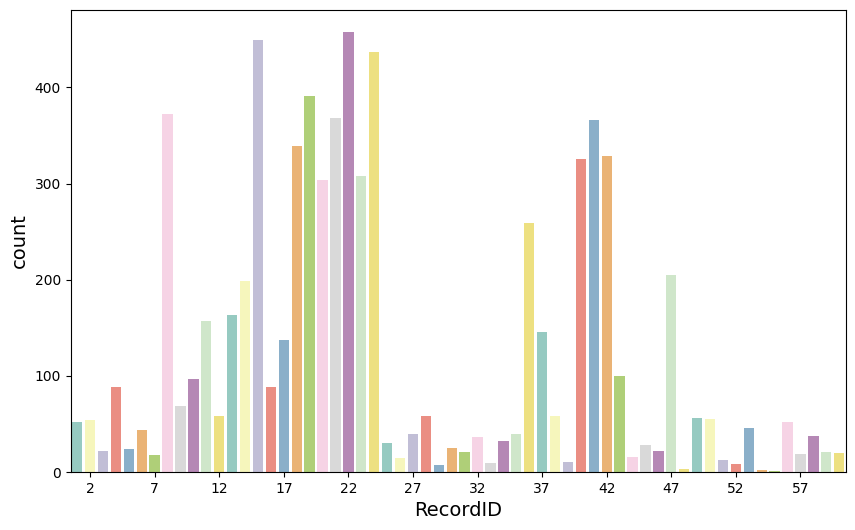

In [278]:
plt.figure(figsize=(10, 6))
sns.countplot(x='RecordID', data=df_frogs, palette='Set3')
plt.xticks(np.arange(1, 61, 5))

plt.show()

Encontramos que existen más grabaciones de algunas ranas individuales que de otras, como es comprensible ateniéndonos a que se trata de un caso real y no siempre es posible obtener todas las grabaciones que quisiéramos de cada individuo.

\\
Habiéndonos encargado ya de la exploración de estas tres, vamos ahora con las características, que son en total 22, es importante saber cómo funcionan y qué valores toman, así como las desviaciones que pudiesen tener. Vamos con el **diagrama de caja** para las 22 MFCCs:

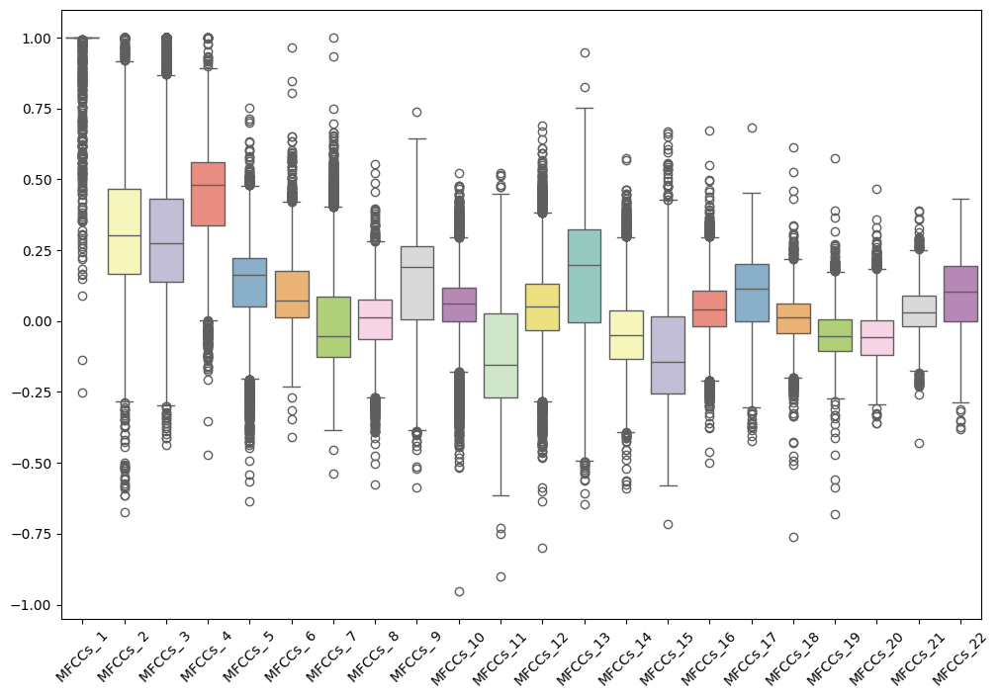

In [279]:
plt.figure(figsize=(12,8))
sns.boxplot(data = df_frogs.iloc[:, :-1], palette = 'Set3') #No queremos la ultima columna, es RecordID
plt.xticks(rotation=45)
plt.show()


Es bastante importante hacer este tipo de análisis, pues fijarse en los valores más frecuentes de cada una de las variables nos puede ayudar a detectar posibles *outliers* **dentro de las características**, y considerarlas ruido, pues como se nos indica estamos antes un caso real y las grabaciones tienen cierto grado de ruido. Por ejemplo, como habíamos comentado para MFCC1, casi todas toman el valor 1 para cada muestra, sin embargo, hay ciertos ejemplos que parecen no tomar ese valor, podrían ser anomalías, o, probablemente, también podrían representar alguna muestra de un conjunto muy poco poblado de anuros.

Veamos el **rango intercuartílico**, que nos ayuda a medir la dispersión de los datos, véase https://es.wikipedia.org/wiki/Rango_intercuart%C3%ADlico

Veámos cuantos valores se alejan en más de 1.5 veces de este rango intercuartílico. **El factor 1.5 es un estándar ampliamente utilizado** para detectar valores atípicos (outliers). Este valor proviene de la estadística descriptiva y se utiliza comúnmente. De hecho, es el estándar que también se usa para los diagramas de caja. Véase https://statologos.com/encontrar-valores-atipicos-con-iqr/

In [280]:
total_outliers = 0

for column in df_frogs.iloc[:, :22].columns:
    Q1 = df_frogs[column].quantile(0.25)
    Q3 = df_frogs[column].quantile(0.75)
    IQR = Q3 - Q1
    lim_inf = Q1 - 1.5 * IQR
    lim_sup = Q3 + 1.5 * IQR

    print(f"\n--- Análisis para la columna: {column} ---")
    print(f"Q1: {Q1}")
    print(f"Q3: {Q3}")
    print(f"IQR: {IQR}")
    print(f"Límite inferior: {lim_inf}")
    print(f"Límite superior: {lim_sup}")

    outliers = df_frogs[column][(df_frogs[column] < lim_inf) | (df_frogs[column] > lim_sup)]
    print(f"Número posible de instancias con ruido según la característica {column} = {outliers.size}")

    total_outliers += outliers.size

print(f"\nTotal de posibles instancias con ruido: {total_outliers/22}")
print(f"\nPorcentaje de posibles instancias con ruido: {total_outliers/22/7195}")


--- Análisis para la columna: MFCCs_ 1 ---
Q1: 1.0
Q3: 1.0
IQR: 0.0
Límite inferior: 1.0
Límite superior: 1.0
Número posible de instancias con ruido según la característica MFCCs_ 1 = 248

--- Análisis para la columna: MFCCs_ 2 ---
Q1: 0.1659449705876045
Q3: 0.46656632191805103
IQR: 0.30062135133044654
Límite inferior: -0.2849870564080653
Límite superior: 0.9174983489137208
Número posible de instancias con ruido según la característica MFCCs_ 2 = 135

--- Análisis para la columna: MFCCs_ 3 ---
Q1: 0.1384452900695095
Q3: 0.4306945768742815
IQR: 0.29224928680477197
Límite inferior: -0.2999286401376485
Límite superior: 0.8690685070814395
Número posible de instancias con ruido según la característica MFCCs_ 3 = 325

--- Análisis para la columna: MFCCs_ 4 ---
Q1: 0.3367365245326635
Q3: 0.5598611040499839
IQR: 0.2231245795173204
Límite inferior: 0.0020496552566829362
Límite superior: 0.8945479733259645
Número posible de instancias con ruido según la característica MFCCs_ 4 = 139

--- Anális

Vamos a usar entonces un **0.025%** de contaminación. Hemos usado la media de las posibles instancias (por cada una de las características) con valores anómalos, dividido entre el número total de muestra (7195).

\\
En el enunciado se nos dice que ciertas MFCCs, al pertenecer a la misma grabación seguramente crecerán y disminuirán de manera conjunta, es decir, **están relacionadas**. Ya hemos tratado esto varias veces en las prácticas, y es que podemos visualizar la matriz de correlación en un mapa de calor, que nos indica cómo de relacionadas están las características entre ellas, de manera que luego podamos aplicar reducción de dimensionalidad en las *features* y eliminar todo aquello que sea redundante para la información.

<Axes: >

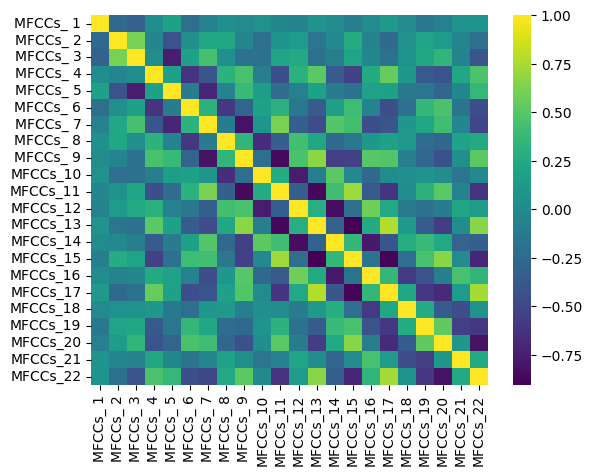

In [281]:
import seaborn as sns
df_frogs2 = df_frogs.iloc[:,:22]
sns.heatmap(df_frogs2.corr(), cmap = 'viridis')

Vayamos ahora entonces con **detección de anomalías** para las instancias. Para ello, vamos a usar ***IsolationForest***, explicado en el ejercicio 3. Brevemente: el modelo trata de aislar ejemplos que puedan ser outliers, y es multivariate pues se centra en abordar cada uno de los ejemplos de nuestro problema, en lugar de las características o features. Tiene un funcionamiento muy parecido a DecissionTree, pues hace un particionamiento recursivo aleatorio entre el máximo y el mínimo de los valores de una característica también aleatoria y se cuenta la profundidad hasta llegar a cada valor aislado.

Como resumen, **las instancias anómalas son más propensas a quedar aisladas** en los nodos más superficiales del árbol debido a su naturaleza única y diferente. En contraste, las instancias normales necesitan más divisiones para ser aisladas. Aquellos valores a los que se llegue muy rápido, es decir, con un tamaño de profundidad bajo, se podrán considerar posibles anomalías.

Vamos a usar el valor de contaminación discutido anteriormente:


In [282]:
!pip install pyod
from pyod.models.iforest import IForest
isft = IForest(contamination=0.025, max_samples=40, behaviour='new')
isft.fit(df_frogs2)

y_train_scores = isft.decision_function(df_frogs2)
y_train_pred = isft.predict(df_frogs2)

print("The threshold for the defined contamination rate:" , isft.threshold_)

def count_stat(vector):
    unique, counts = np.unique(vector, return_counts=True)
    return dict(zip(unique, counts))

print("The training data:", count_stat(y_train_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but IsolationForest was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but IsolationForest was fitted without feature names
  warnings.warn(


The threshold for the defined contamination rate: -2.184413267674115e-17
The training data: {0: 7015, 1: 180}


Ahora que sabemos que **IForest ha detectado 180 instancias como posibles anomalías**, veamos tambien adicionalmente la importancia que tienen las características, que también conjuga con el análisis que hemos hecho antes de la correlación entre las mismas:

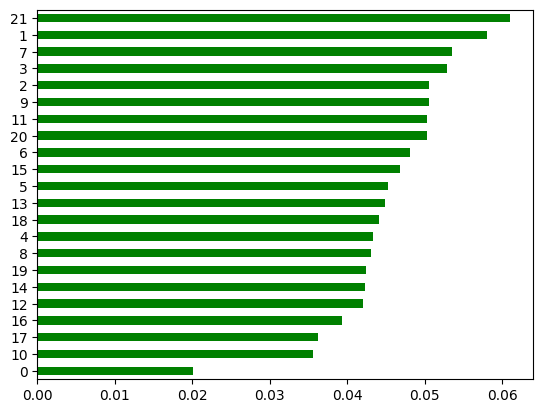

In [283]:
from matplotlib import pyplot as plt
isft_vi = isft.feature_importances_
for_plot = pd.DataFrame({'x_axis':df_frogs2.columns, 'y_axis':isft_vi}).sort_values(by='y_axis',ascending=True)
for_plot['y_axis'].plot.barh( color = 'green');

Parece que la característica 0 (MFCC1) es la menos importante, mientras que la 7 (MFCC 8) es la más importante. Esta importancia se mide mediante el índice de impureza Gini, véase https://en.wikipedia.org/wiki/Decision_tree_learning#Gini_impurity.

Por complementar un poco más este análisis, habiendo hecho análisis de anomalías, veamos un acercamiento a lo que sería la distribución de los datos en 3D, para ver si coincide con la idea que nos podríamos haber hecho hasta ahora del dataset. Podemos ver cómo se agrupan por **Genus**, por ejemplo, y visualizar cuáles de las instancias han sido consideradas anomalías, y ver si tiene sentido, al menos gráficamente:

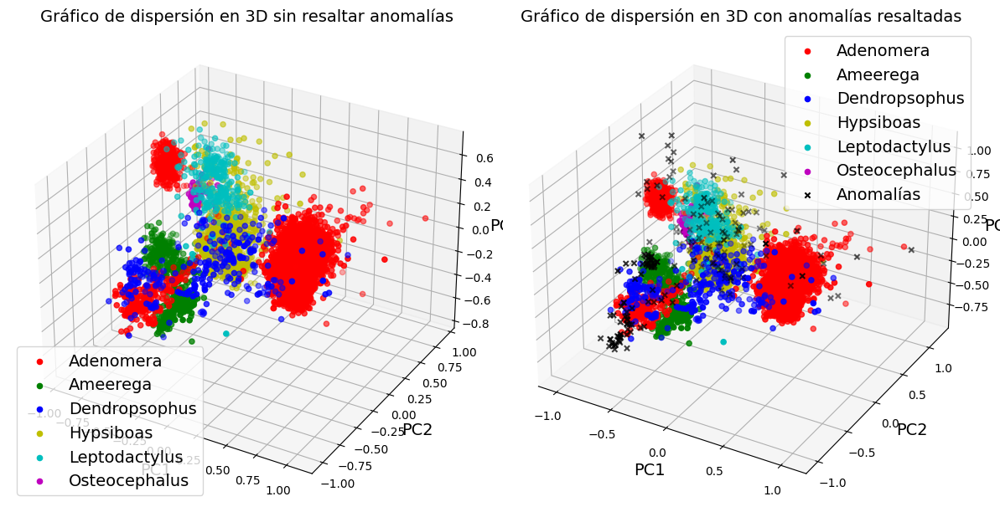

In [284]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_frogs2)

df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2', 'PC3'])

labels = df_frogs['Genus'].unique()
colors = ['r', 'g', 'b', 'y', 'c', 'm']

fig = plt.figure(figsize=(12, 7))

#Subplot sin destacar las anomalías
ax1 = fig.add_subplot(121, projection='3d')
for label, color in zip(labels, colors):
    df_label = df_pca[(df_frogs['Genus'] == label) & (y_train_pred == 0)]
    ax1.scatter(df_label['PC1'], df_label['PC2'], df_label['PC3'], c=color, label=label)

ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax1.set_zlabel('PC3')
ax1.set_title('Gráfico de dispersión en 3D sin resaltar anomalías')
ax1.legend()

#Subplot destacando las anomalías
ax2 = fig.add_subplot(122, projection='3d')
for label, color in zip(labels, colors):
    df_label = df_pca[(df_frogs['Genus'] == label) & (y_train_pred == 0)]
    ax2.scatter(df_label['PC1'], df_label['PC2'], df_label['PC3'], c=color, label=label)

anomalies = df_pca[y_train_pred == 1]
ax2.scatter(anomalies['PC1'], anomalies['PC2'], anomalies['PC3'], marker='x', c='k', label='Anomalías')

ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
ax2.set_zlabel('PC3')
ax2.set_title('Gráfico de dispersión en 3D con anomalías resaltadas')
ax2.legend()

plt.tight_layout()
plt.show()


Aparentemente, en general, hay bastantes instancias que parecen estar siendo clasificadas bien como anomalías, pues están bastante alejadas de los agrupamientos de sus géneros. Sin embargo, hay otras que según el mismo criterio, deberían estar siendo consideradas anomalías, pues están muy alejadas. Basta fijarse en el punto aislado de centro/abajo del género *Leptodactylus*.

\\
Por último, a modo de visualización de distancias entre los datos, algo bastante relevante en problemas de clústering, vamos a visualizar un **dendrograma** de los datos:
 - Los **nodos** o puntos de unión representan elementos individuales o grupos de elementos.
 - Las **ramas** son las líneas que conectan los nodos, mostrando la *relación jerárquica* entre ellos.
 - La **longitud** de las ramas puede representar la distancia o disimilitud entre los grupos. **Cuanto mayor sea la altura de la unión, mayor será la diferencia entre los elementos agrupados en ese nodo.**

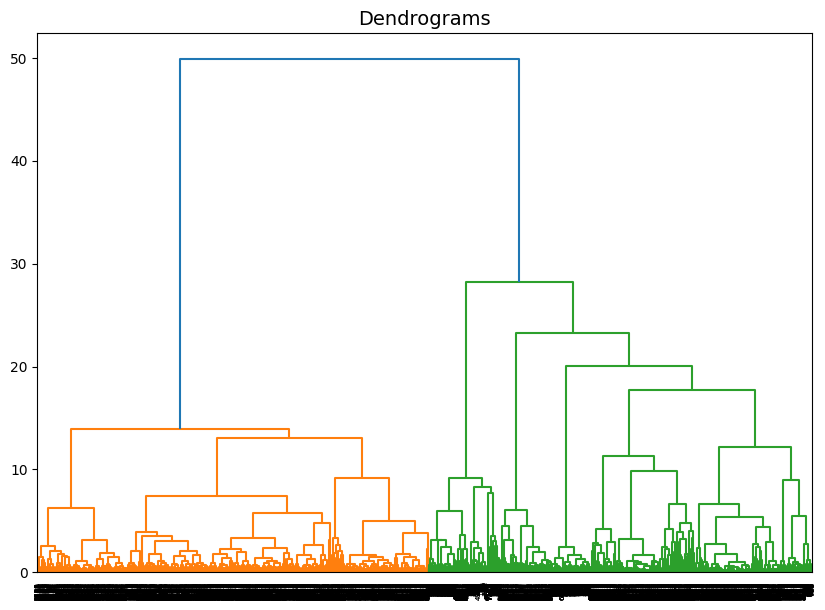

In [285]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))
plt.title("Dendrograms")
dend = shc.dendrogram(shc.linkage(df_frogs2, method='ward'))

Para su **interpretación** se puede hacer una observación de la altura a la que se cortan las ramas o por ejemplo, cortar a cierta altura, y ver qué clusters parecen formarse. En nuestro caso, parece haber dos grupos muy fácilmente identifcables, y dentro de cada uno, en el caso de la izquierda por ejemplo podríamos identificar 3 clústers o en e de la derecha 4 o 5. Véase https://www.displayr.com/what-is-dendrogram/

#####**Preprocesado de datos**

Primero, vamos a empezar normalizando nuestro datos, pues casi siempre es buena práctica que el dominio de nuestras características se muevan entre 0 y 1, para mayor manejabilidad de los mismos, y puesto que posteriormente se pretende hacer una reducción de dimensionalidad usando PCA():

In [286]:
from sklearn.preprocessing import StandardScaler
#df_frogs2 tiene solo los MFCCs

scaler = StandardScaler()
df_final = pd.DataFrame(scaler.fit_transform(df_frogs2), index = df_frogs.index, columns = df_frogs2.columns)

df_final.describe()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22
count,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,...,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,7.195000e+03,7195.000000,7.195000e+03,7.195000e+03,7.195000e+03
mean,-3.476178e-16,1.580081e-16,-3.160162e-17,-3.318170e-16,-9.480487e-17,-6.320325e-17,-1.580081e-17,6.320325e-17,-7.900406e-17,3.950203e-17,...,3.160162e-17,1.580081e-17,1.580081e-17,-1.580081e-17,9.480487e-17,4.740243e-17,0.000000,3.160162e-17,4.740243e-17,6.320325e-17
std,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,...,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,1.000069e+00,1.000069,1.000069e+00,1.000069e+00,1.000069e+00
min,-1.798363e+01,-4.558260e+00,-2.835774e+00,-5.730376e+00,-4.689655e+00,-4.222105e+00,-3.136579e+00,-4.954132e+00,-3.997445e+00,-7.933425e+00,...,-3.843372e+00,-3.613917e+00,-3.280338e+00,-4.509639e+00,-3.695589e+00,-9.053491e+00,-7.648086,-3.274841e+00,-5.891010e+00,-3.782383e+00
25%,1.465779e-01,-7.210034e-01,-6.556853e-01,-6.815309e-01,-4.629605e-01,-7.089302e-01,-7.254735e-01,-5.394838e-01,-6.903220e-01,-4.495243e-01,...,-7.434950e-01,-6.146491e-01,-8.218417e-01,-5.138205e-01,-6.551746e-01,-5.886854e-01,-0.685797,-7.191665e-01,-6.912932e-01,-7.051159e-01
50%,1.465779e-01,-9.787851e-02,-1.388897e-01,2.212265e-01,2.108925e-01,-2.147770e-01,-2.989222e-01,1.172461e-01,3.413695e-01,5.885357e-02,...,2.222515e-01,-7.521819e-02,-2.212693e-01,-8.180996e-03,1.745001e-01,4.797713e-02,-0.038187,-2.055943e-02,-7.600078e-02,1.442491e-01
75%,1.465779e-01,6.539691e-01,4.533826e-01,7.102452e-01,5.872096e-01,6.479695e-01,5.074717e-01,6.490242e-01,7.663936e-01,4.856939e-01,...,8.394058e-01,5.140923e-01,6.348228e-01,5.419523e-01,8.203901e-01,6.389138e-01,0.675971,5.796250e-01,6.582274e-01,8.689013e-01
max,1.465779e-01,3.093771e+00,2.613861e+00,3.455684e+00,3.842395e+00,7.194984e+00,5.842724e+00,4.747728e+00,3.406890e+00,3.672732e+00,...,3.841943e+00,4.032634e+00,4.107949e+00,5.242714e+00,4.291889e+00,7.156018e+00,7.556147,5.533108e+00,4.435742e+00,2.792111e+00


Ahora que nuestros datos son más tratables, podemos proceder a hacer una selección de *features* o reducción de dimensionalidad. Como otras veces, vamos a emplear PCA(), quedándonos con un 99% de la variabilidad explicada.

In [287]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.99, svd_solver = 'full')
X_train = pca.fit_transform(df_final)

pca.n_components_

17

Esto cuadra con lo discutido anteriormente, resulta que hay ciertas *features* que están correlacionadas. Al aplicar PCA hemos reducido la dimensionalidad de nuestro espacio de características de 22 a 17, eliminando así información redundante de algunas de ellas y haciendo el entrenamiento más sencillo.

<Axes: >

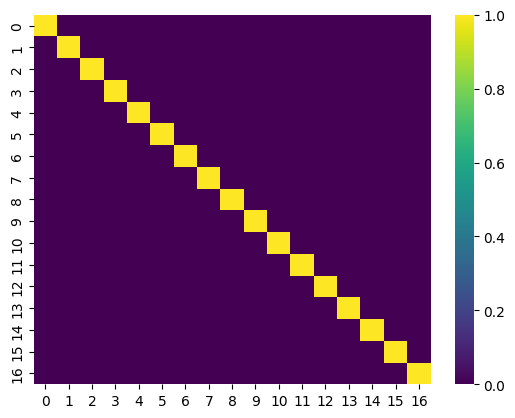

In [288]:
X_train2 = pd.DataFrame(X_train)
sns.heatmap(X_train2.corr(), cmap = 'viridis')

Vamos ahora con la **eliminación de anomalías detectadas**.:

In [289]:
#Ejecutar sólo una vez!
X_train = X_train[y_train_pred != 1]
df_frogs = df_frogs[y_train_pred != 1]

In [290]:
len(X_train)

7015

Hemos eliminado 180 muestras que consideramos anómalas. En total, nos quedamos con 7015 ejemplos para entrenar.

Un enfoque que he considerado es el de **codificar una o varias de las etiquetas** que tenemos (ya que tenemos 4) y tratarla como una característica más, pues primeramento he considerado que puede aportar información adicional a nuestro dataset. Sin embargo, como en el ejercicio se nos pide que entrenemos y luego veamos cómo y según qué criterio se ha agrupado, considero que es mejor dejar las 4 etiquetas para así después comparar con nuestra **ground truth** y ver según qué ha podido agrupar el modelo en cuestión.

#####**Métricas a utilizar**

Vamos a escoger tres métricas para medir los resultados obtenidos por los modelos para este problema. Es importante considerar que no hay una métrica única que sea la mejor en todos los casos, ya que diferentes métricas pueden proporcionar información diferente sobre la calidad y distribución de los clusters.

\\

* **Coeficiente de Silueta**: Comentada en el primer ejercicio. Mide cohesión y separación entre clusters. **Cuanto más alta sea mejor**. Se calcula teniendo en cuenta las distancias entre las instancias y tanto las instancias del mismo como de diferente clúster. (Véase la imagen de abajo)

  Valores cercanos a +1 indican que el objeto está bien dentro de su propio cluster y lejos de los otros, valores cercanos a 0 indican que está cerca del límite de decisión entre dos clusters y valores negativos indican que podría haber sido asignado al cluster incorrecto.

<center><img src=https://www.researchgate.net/profile/Ayesha-Siddique/publication/329707597/figure/fig3/AS:704776236957704@1545043157959/An-Example-for-Computing-the-Silhouette-Coefficient.png></center>

  Imagen extraída de https://www.researchgate.net/figure/An-Example-for-Computing-the-Silhouette-Coefficient_fig3_329707597

  \\

* **Índice de Davies-Bouldin (DB)**: Este índice mide la bondad de los clusters basándose en su distancia media entre los puntos del cluster, o compacidad, y su distancia entre los centroides de los clusters, o separabilidad. **Valores más bajos** indican una mejor partición.

* **Índice de Calinski-Harabasz (CH)**: Calcula la relación entre la dispersión intra-cluster y la dispersión inter-cluster. **Valores más altos** indican clusters más densos y mejor separados.

\\
Las tres métricas se resumen en la siguiente imagen:

<center><img src=https://i.ytimg.com/vi/kPzWTSpYjo4/maxresdefault.jpg></center>

> *BGSS(Between-Cluster Sum of Squares) representa la suma ponderada de las distancias euclídeas al cuadrado entre cada centroide del cluster y el centroide de datos global (calculado usando todos los ejemplos)*

> *WGSS(Within-Cluster Sum of Squares) es la suma de las distancias euclídeas al cuadrado entre los puntos y sus respectivos centroides de cluster asignado.*

Extraída del vídeo https://www.youtube.com/watch?v=kPzWTSpYjo4&ab_channel=MEDIOCRE_GUY

#####**Selección de modelos y sus respectivos parámetros**

1. ***K-means:*** Aprovechando que hemos hecho un estudio bastante completo de este modelo en el ejercicio 1 lo voy a usar como modelo adicional (ahora presento 2 más) para poder comprobar como funciona en un caso real y un dataset que no es sintético, como hicimos en 1.9. La explicación de cómo funciona ya la hemos hecho en el ejercicio anterior. Lo único que sí debemos hacer es escoger el número de clústers a utilizar. Veámos cuál puede ser el óptimo para el problema de los anuros:

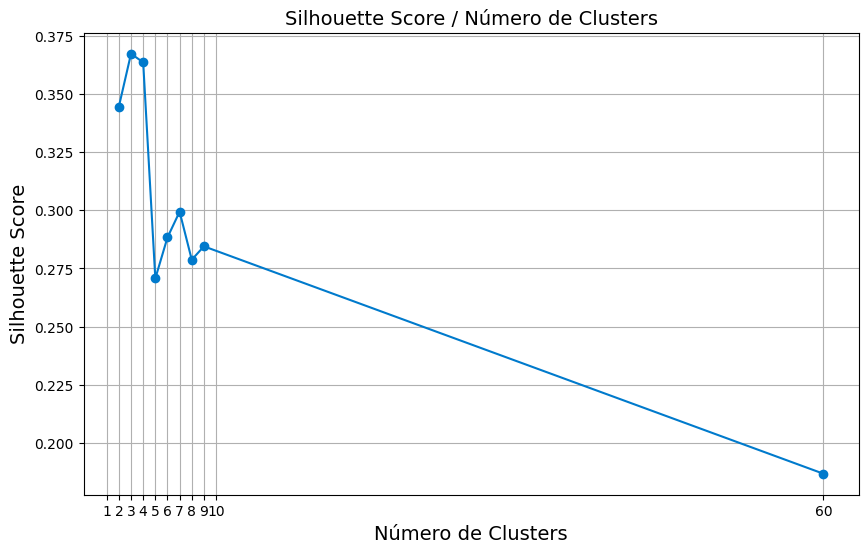

In [291]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

rango_clusters = list(range(2, 10))
#Probamos también con 60, pues es el número de individuos que se han grabado, RecordID
rango_clusters.append(60)
silhouette_scores = []

for num_clusters in rango_clusters:

    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
    kmeans.fit(X_train)

    silhouette_scores.append(silhouette_score(X_train, kmeans.labels_))

plt.figure(figsize=(10, 6))
plt.plot(rango_clusters, silhouette_scores, marker='o', color='#007acc')
plt.title('Silhouette Score / Número de Clusters')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(list(range(1,11)) + [60])
plt.grid(True)
plt.show()

Vamos a usar entonces un número de clúster igual a 4, pues aunque k = 3 tenga un mejor score, como lo que buscamos es que consiga clústers que identifiquen a los individuos por familia, género... justamente hay 4 familias, y tiene un buen score de silueta, por tanto nos vamos a quedar con 4 clústers.

En cuanto a la inicialización, ***k-means++*** es una buena elección, pues en principio no tenemos la suficiente información en cuanto a la distribución como para elegir otro método. Igualmente, el algoritmo que vamos a usar va a ser ***lloyd***, puesto que *k-means* ya es suficientemente rápido como para buscar eficiencia.

\\
**Para la selección de los dos modelos para clustering**, he usado la página siguiente para comparar funcionamientos y ver cuál me resultaba más llamativo e interesante. Aquí una imagen comparativa de todos los métodos de clustering implementados por sklearn:

<center><img src=https://scikit-learn.org/stable/_images/sphx_glr_plot_cluster_comparison_001.png width="800" height="500"></center>

Imagen extraída de https://scikit-learn.org/stable/modules/clustering.html#clustering

2. **Spectral clustering (no lo voy a usar):** Se basa en ***propiedades espectrales*** () de la matriz de similitud o correlación de los datos. Aunque puede sonar complicado, la idea detrás del clustering espectral es bastante intuitiva. Veamos los conceptos esenciales:
  - **La matriz de similitud** se construye usando el hiperparámetro *affinity*, y, punto a punto, dando un valor para cada pareja de instancias.
  - **La matriz laplaciana**, se construye a partir de la matriz de similitud, que captura la estructura de ***conectividad*** de los datos. Hay diferentes formas de definir la matriz Laplaciana, pero una común es la matriz Laplaciana no normalizada, que se define como la diferencia entre una matriz diagonal (que contiene las sumas de las filas o columnas de la matriz de similitud) y la matriz de similitud.
  - Luego, se calculan los **autovectores y autovalores** de la matriz Laplaciana. Los autovectores representan direcciones en el espacio de los datos que capturan la estructura (de aquí la conectividad mencionada antes) de agrupación de los datos.
  - Se seleccionan los autovectores correspondientes a los **k autovalores más pequeños**, donde k es el número deseado de clústeres (se puede discutir de la misma manera que se hacía para *k-means*.
  - Finalmente, se aplica un **algoritmo de clustering estándar** (como k-means) en el espacio de características definido por los autovectores seleccionados. Esto agrupa los puntos en el espacio de características en los k clústeres deseados. (El algoritmo lo decide el parámetro *assing_labels*)

Según *scikit-learn*, sus casos de uso: "*Few clusters, even cluster size, non-flat geometry*" que creo que se ajusta bastante bien a nuestro problema. El clustering espectral tiene varias **ventajas**, incluida su capacidad para capturar estructuras de agrupación complejas y no lineales en los datos, así como reducir la dimensionalidad. Sin embargo, también puede ser **computacionalmente costoso**, especialmente para conjuntos de datos grandes, debido al cálculo y almacenamiento de la matriz Laplaciana y la necesidad de calcular los autovectores y autovalores.

Véase: https://en.wikipedia.org/wiki/Spectral_clustering

(**FINALMENTE DECIDO NO USAR ESTE MODELO: los tiempos de entrenamiento son demasiado altos y haciendo algún *grid search* también ha estado buscando durante más de una hora**)

Las razones son que *SpectralClustering*, leyendo en *Hands-on Machine Learning with Scikit Learn Keras and TensorFlow* *(Géron, 2019, p. 260)*, no escala nada bien cuando el número de instancias es alto y tampoco funciona bien cuando los clústeres no tienen tamaños similares, el cual es nuestro caso.

\\


2. **OPTICS:** Se trata de un modelo muy parecido al ya estudiado DBSCAN, que podría incluso considerarse su **generalización**. La principal diferencia es la manera en que se trata con el hiperparámetro *eps* que define las vencindades, ahora en lugar de un valor concreto será un **rango de valores**.

  Este algoritmo de clustering basado en densidad, a diferencia de DBSCAN, **no necesita saber previamente el número de clústers** que buscamos y se adapta bien cuando el escenario presenta **clústers de distintas densidades** (como ocurre en nuestro problema).

  También genera una ordenación de los puntos de datos en función de su densidad, lo que permite la extracción de clusters con diferentes parámetros. A esto se le llama ***reachability graph*** y generando cada uno de ellos para cada uno de los *eps* que usa el algoritmo genera un *Reachability plot*, que representa la densidad viene representada en el eje Y. De esta manera, si hacemos un corte en el gráfica para un valor del mismo eje, lo que obtenemos sería una ejecución de DBSCAN y todos los valores que queden encima de ese corte serán considerados *outliers*. Véase la siguiente imagen:

<center><img src = https://scikit-learn.org/stable/_images/sphx_glr_plot_optics_001.png width="800" height="500"></center>

Imagen extraída de https://scikit-learn.org/stable/modules/clustering.html#optics

Los **hiperparámetros** que vamos a manipular son los siguientes:
 - ***min_samples*** : Igual que en DBSCAN, se trata del número de muestras mínimas que debe tener una instancia como vecinas para ser considerado un *core point*.
 - ***max_eps*** : Determina el número máximo de *eps* o distancia para considerar vecino a una instancia que se va a usar. Reducir este parámetro resulta en tiempos de ejecución más bajos pues se recorre el rango entero desde 0 hasta max_eps. Como hemos escalado nuestros datos, la distancia entre ellos no debe ser muy grande.

 \\
Hacemos ahora un *grid_search*, pero ahora como desconocemos las etiquetas **voy a usar como *scorer* el Índice de Davies Bouldin**, de manera que vamos a hacer una búsqueda por los hiperparámetros quedándonos con los que mejor índice nos devuelva.

Esto se consigue usando *make_scorer* de sklearn:

In [292]:
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import OPTICS
from sklearn.metrics import make_scorer
from sklearn.metrics import davies_bouldin_score

params = {
    'min_samples':  [100, 200, 250],
    'max_eps': [2.0, 5.0, 10.0]
}

scoring = make_scorer(silhouette_score)

clf = GridSearchCV(
    estimator=OPTICS(),
    param_grid=params,
    scoring = scoring,
    cv=2,
    n_jobs=5,
    verbose=3
)

clf.fit(X_train)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan]
  warnings.warn(


GridSearchCV(cv=2, estimator=OPTICS(), n_jobs=5,
             param_grid={'max_eps': [2.0, 5.0, 10.0],
                         'min_samples': [100, 200, 250]},
             scoring=make_scorer(silhouette_score), verbose=3)

In [293]:
print(clf.best_params_)

{'max_eps': 2.0, 'min_samples': 100}


Usaremos estos valores **para nuestro entrenamiento** del modelo OPTICS.

3. **BIRCH:** (Balanced Iterative Reducing and Clustering using Hierarchies) es un algoritmo de **clustering jerárquico** diseñado para manejar grandes conjuntos de datos, especialmente en entornos donde la memoria es limitada. Hagámos un breve análisis de su funcionamiento a través de sus hiperparámetros y componentes:
 - BIRCH organiza los datos en una estructura jerárquica de árbol, donde cada nodo interno es representado por un conjunto llamado "Clustering Features Nodes" (CF Nodes). Los CF's se utilizan para **resumir** los datos en cada nivel o grado de profundidad del árbol.
 - BIRCH tiene dos parámetros principales que pueden ser ajustados: el **factor de ramificación** (*branching_factor*) y el **umbral de fusión** (*threshold*). El factor de ramificación controla cuántos sub-clústeres puede tener un nodo antes de dividirse en dos, mientras que el umbral de fusión determina cuándo se fusionan dos nodos vecinos.

  - Se van añadiendo nuevas muestras al árbol (primeramente a la raíz) y durante dicha **inserción**, BIRCH utiliza los criterios de fusión y ramificación mencionados para mantener la estructura del árbol y actualizar los CF's de manera eficiente.
  - Las muestras se fusionan con los **sub-clústeres más cercanos** dentro del árbol, controlando la distancia entre ellos con un umbral predefinido. Si la fusión resulta en un sub-clúster demasiado grande o si la estructura del árbol excede el factor de ramificación dado, se realizan divisiones recursivas para mantener la eficiencia y la calidad del clustering.
  - **El árbol final** de BIRCH proporciona una representación jerárquica de la estructura de clústeres en los datos. Cada nivel del árbol representa una agrupación de puntos, donde los nodos internos representan clústeres más grandes y los nodos hoja representan clústeres más específicos y detallados.

  <center><img src = https://analyticsindiamag.com/wp-content/uploads/2021/07/image-248.png></center>
  Extraída de https://analyticsindiamag.com/guide-to-birch-clustering-algorithmwith-python-codes/

  > En esta imagen se puede observar la estructura que podría tener un ClusterFeatureTree. El nodo raíz tiene hijos que NO son hojas, que a su vez tienen hijos que sí lo son. Si estas hojas tienen L entradas, quiere decir que se cumple que este valor L es menor que el valor pasado como threshold.

  Se recomienda usar este algoritmo cuando el número de características es $<20$.

 Véase también https://scikit-learn.org/stable/modules/clustering.html#birch

 Hagámos ahora entonces también un grid_search de los dos parámetros más importantes:

In [294]:
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import Birch
from sklearn.metrics import make_scorer
from sklearn.metrics import davies_bouldin_score

params = {
    'threshold':  [0.3, 0.5, 1],
    'branching_factor': [100, 50, 30]
}

scoring = make_scorer(davies_bouldin_score)

clf = GridSearchCV(
    estimator=Birch(),
    param_grid=params,
    scoring = scoring,
    cv=2,
    n_jobs=5,
    verbose=3
)

clf.fit(X_train)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan]
  warnings.warn(


GridSearchCV(cv=2, estimator=Birch(), n_jobs=5,
             param_grid={'branching_factor': [100, 50, 30],
                         'threshold': [0.3, 0.5, 1]},
             scoring=make_scorer(davies_bouldin_score), verbose=3)

In [295]:
print(clf.best_params_)

{'branching_factor': 100, 'threshold': 0.3}


Nos vamos a quedar entonces con estos hiperparámetros **para entrenar** nuestro modelo BIRCH.

\\


#####**Entrenamiento de los modelos**

Vamos ahora a entrenar los modelos escogidos con los hiperparámetros discutidos:

\\


**ENTRENAMIENTO DE K-MEANS**

In [296]:
from sklearn.cluster import KMeans

clf1 = KMeans(n_clusters = 4)

clf1.fit(X_train)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=4)

**ENTRENAMIENTO DE OPTICS**

In [297]:
from sklearn.cluster import OPTICS

clf2 = OPTICS(min_samples = 100, max_eps = 2.0)

clf2.fit(X_train)

OPTICS(max_eps=2.0, min_samples=100)

**ENTRENAMIENTO DE BIRCH**

In [298]:
from sklearn.cluster import Birch

clf3 = Birch(branching_factor = 100, threshold = 0.3)

clf3.fit(X_train)

Birch(branching_factor=100, threshold=0.3)

#####**Evaluación y análisis de los modelos**

Para **k-means** ya vimos cómo se comporta en general. Vamos ahora a obtener distintas métricas ya discutidas que miden la **calidad del clústering**:

In [299]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

silhouette1 = silhouette_score(X_train, clf1.labels_)
db1 = davies_bouldin_score(X_train, clf1.labels_)
ch1 = calinski_harabasz_score(X_train, clf1.labels_)

print("Modelo KMEANS -------------")
print("Silueta:", silhouette1)
print("DB:", db1)
print("CH:", ch1)

Modelo KMEANS -------------
Silueta: 0.372247494300013
DB: 1.2563244577057129
CH: 2241.4932501052676


Si no tuviesemos ninguna de las etiquetas, la evaluación de los modelos que podríamos hacer no iría mucho más allá de lo que ya hemos hecho. Sin embargo, a partir de ahora, vamos a usar nuestra **ground truth** para saber si, aunque las agrupaciones que se hayan hecho puedan obtener buenas métricas y tengan una calidad decente, tienen sentido las agrupaciones que se han hecho.

Para ello, vamos a recorrer las instancias y vamos a obtener qué clúster se le ha asignado y a cuál podría corresponder en la realidad, atendiendo a las 4 etiquetas sobre las que ha podido aprender. Vamos a usar un *count plot*:

<ipython-input-300-c037ec653b00>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_frogs['Cluster'] = clusters


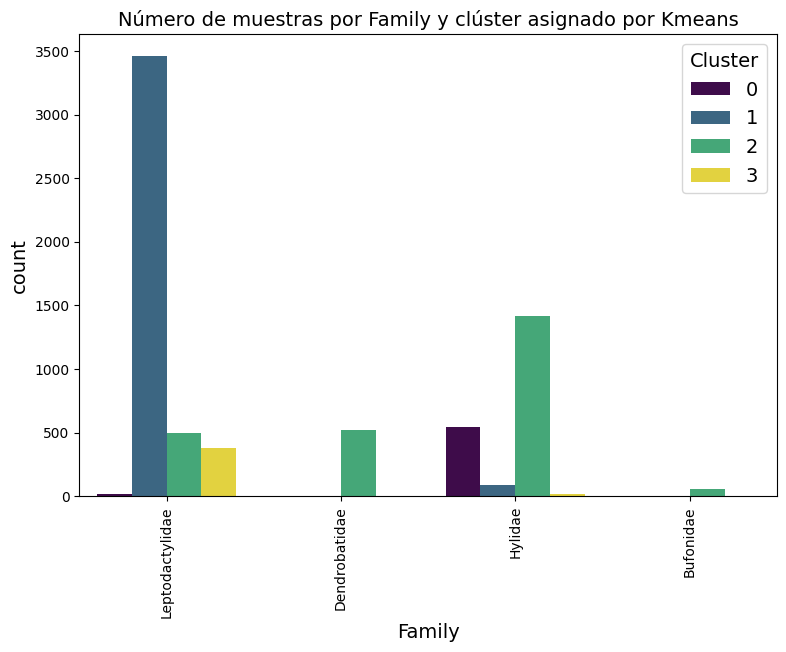

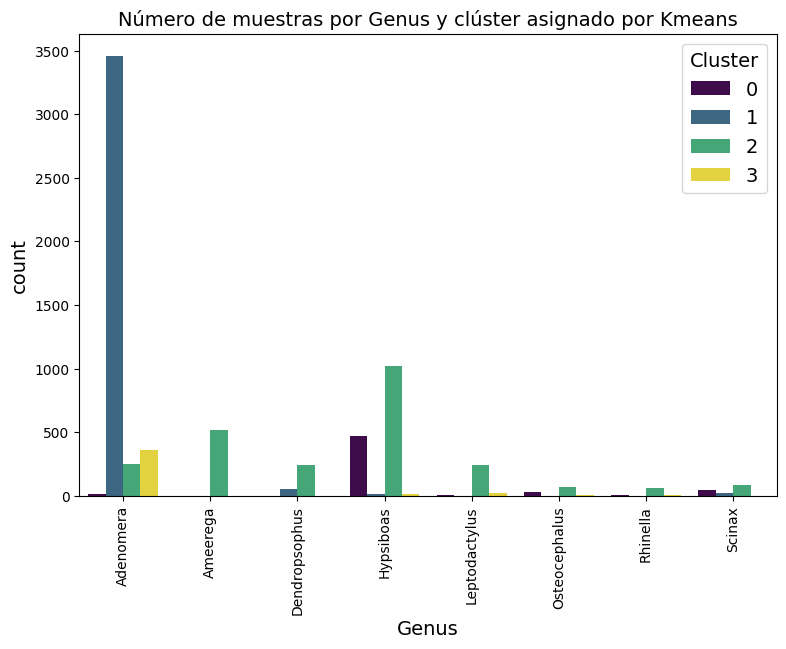

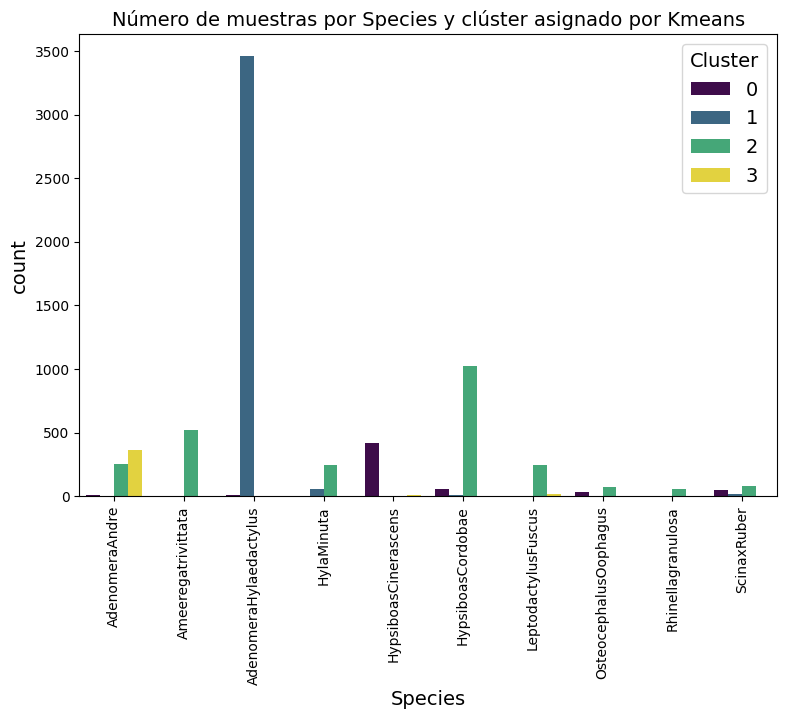

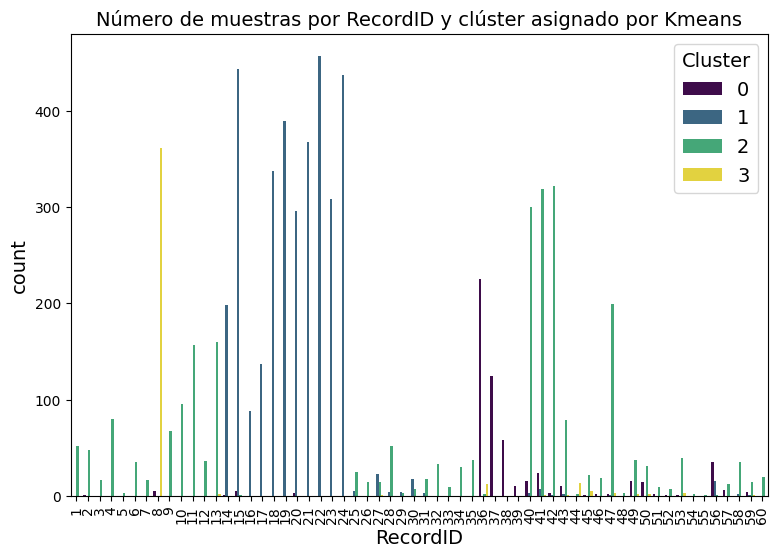

In [300]:
clusters = clf1.labels_
df_frogs['Cluster'] = clusters

def plot_clusters(df, column, cluster, modelo):
    plt.figure(figsize=(9, 6))
    sns.countplot(data=df, x=column, hue= cluster, palette='viridis')
    plt.title(f'Número de muestras por {column} y clúster asignado por {modelo}')
    plt.xticks(rotation=90)
    plt.show()

for col in ['Family', 'Genus', 'Species', 'RecordID']:
    plot_clusters(df_frogs, col, 'Cluster', 'Kmeans')


Tiene sentido que, aparentemente, para ***RecordID*** no agrupe nada bien, pues teníamos puesto como hiperparámetro 4 clústers.

Para ***Family*** parece que igual está todo algo más diferenciado, sobre todo para la primera de ellas. Sin embargo, tampoco es un agrupamiento efectivo pues el clúster 0 tiene a todas las distintas familias.

Para ***Genus*** y ***Species*** parece que siempre encuentra un clúster coherente, pero los demás tienen instancias de todo tipo.

Vamos ahora con **OPTICS**:

In [301]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

#Evaluamos el primer modelo
silhouette2 = silhouette_score(X_train, clf2.labels_)
db2 = davies_bouldin_score(X_train, clf2.labels_)
ch2 = calinski_harabasz_score(X_train, clf2.labels_)

print("Modelo OPTICS -------------")
print("Silueta:", silhouette2)
print("DB:", db2)
print("CH:", ch2)

Modelo OPTICS -------------
Silueta: 0.21177888845872875
DB: 1.650987288147262
CH: 722.1908929967682


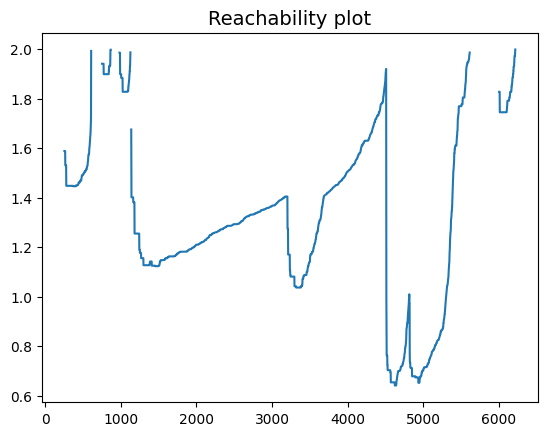

In [302]:
reachability = clf2.reachability_[clf2.ordering_]
plt.plot(reachability)
plt.title('Reachability plot')
plt.show()

En este gráfico, se mapean las distancias de alcanzabilidad (*reachability*) para cada punto, discutidas previamente. Claramente, a partir de un punto, podemos ver cómo se han extendido los clusters en un orden ascendente basado en esta distancia. Esto se interpreta como que: los "**valles**" identifican los clústers, y los picos son los puntos de corte o que diferencian dichos clústers.

Aún así, para muchas instancias, no muy bien distribuidas, es difícil interpretar los resultados a partir de esta gráfica. Veamos el mismo enfoque de antes, a ver cómo ha agrupado realmente OPTICS:

<ipython-input-303-6b7ed4d099bb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_frogs['Cluster2'] = clusters


Nº estimado de clusters: 6
Nº estimado de puntos de ruido: 1706


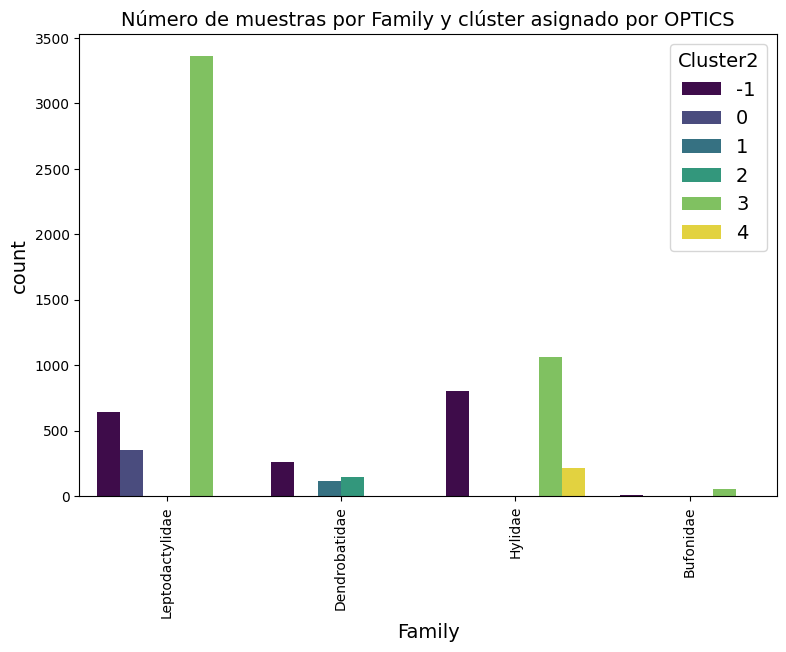

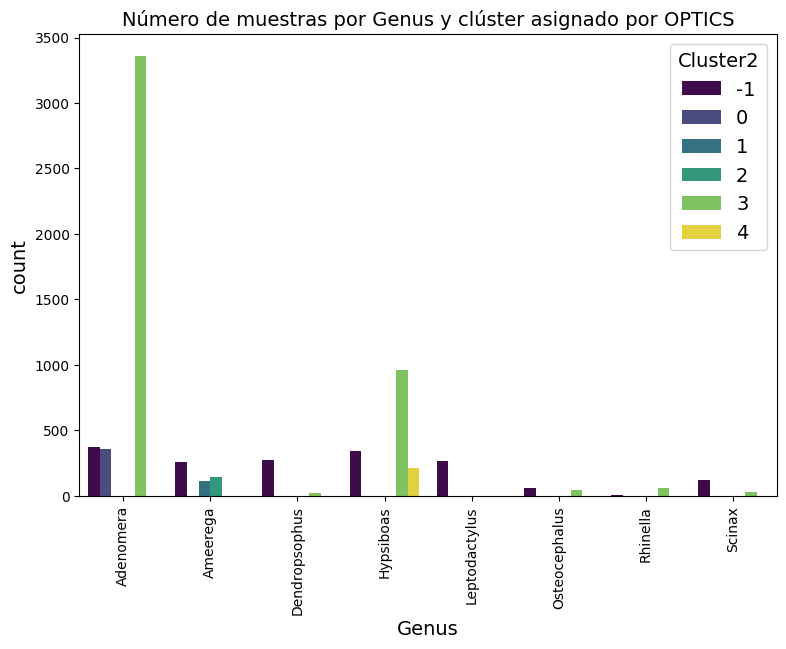

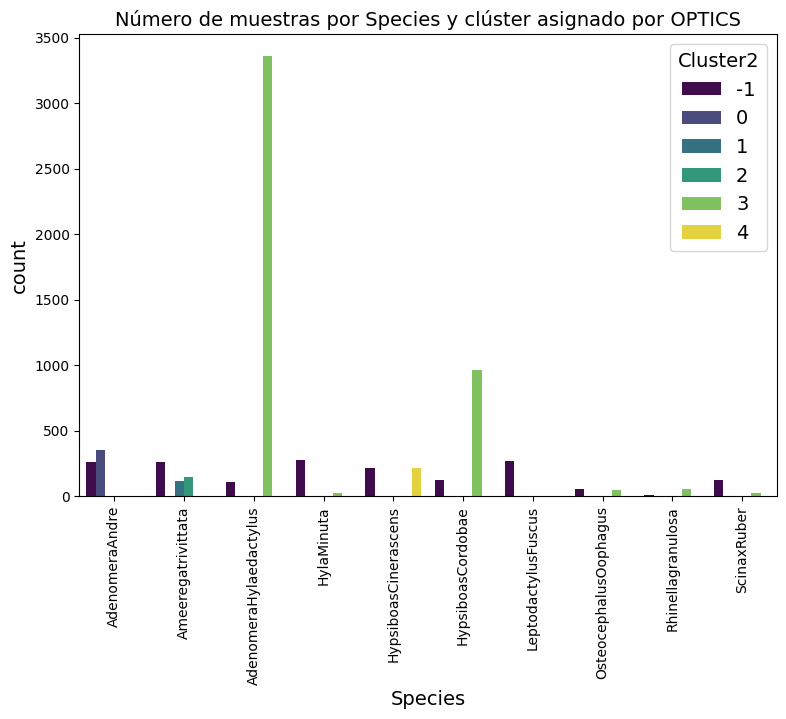

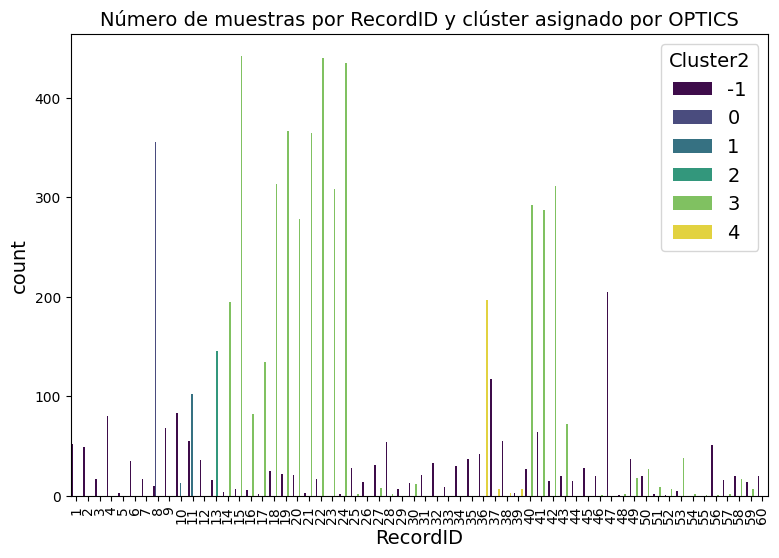

In [303]:
clusters = clf2.labels_
df_frogs['Cluster2'] = clusters

no_clusters = len(np.unique(clusters) )
no_noise = np.sum(np.array(clusters) == -1, axis=0)

print('Nº estimado de clusters: %d' % no_clusters)
print('Nº estimado de puntos de ruido: %d' % no_noise)

for col in ['Family', 'Genus', 'Species', 'RecordID']:
    plot_clusters(df_frogs, col, 'Cluster2', 'OPTICS')

Los índices de los clústeres indican que los $-1$ están siendo considerados como **anomalías**, no se han incluido en ningún vecindario, como pasaba con DBSCAN. Es decir, realmente OPTICS detecta **5 clusters**.

Por último, veamos **BIRCH**, vamos a hacer el mismo análisis realizado para los dos modelos anteriores:

In [304]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

#Evaluamos el primer modelo
silhouette3 = silhouette_score(X_train, clf3.labels_)
db3 = davies_bouldin_score(X_train, clf3.labels_)
ch3 = calinski_harabasz_score(X_train, clf3.labels_)

print("Modelo BIRCH -------------")
print("Silueta:", silhouette3)
print("DB:", db3)
print("CH:", ch3)

Modelo BIRCH -------------
Silueta: 0.35632614198602175
DB: 1.2143582812774696
CH: 2435.1812486191584


<ipython-input-305-4dbc33b15ea7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_frogs['Cluster3'] = clusters


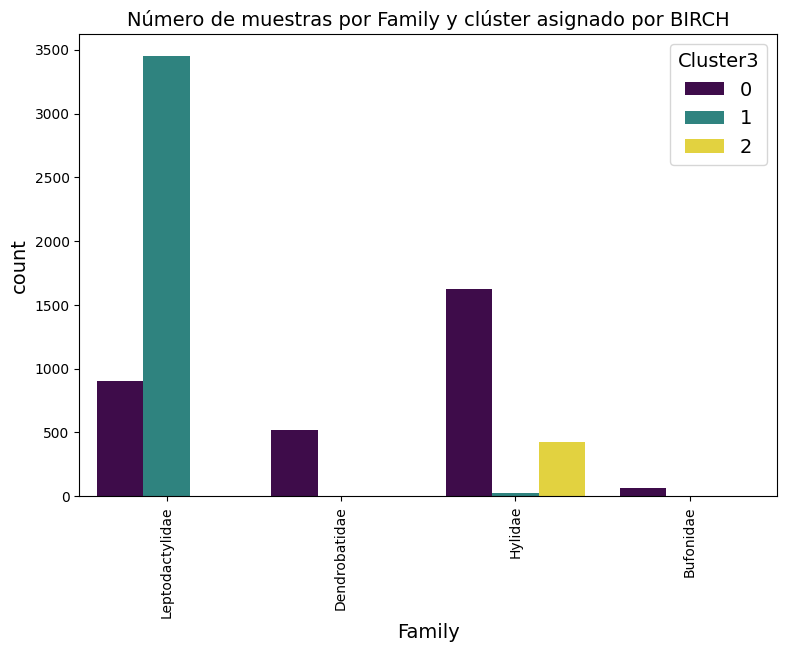

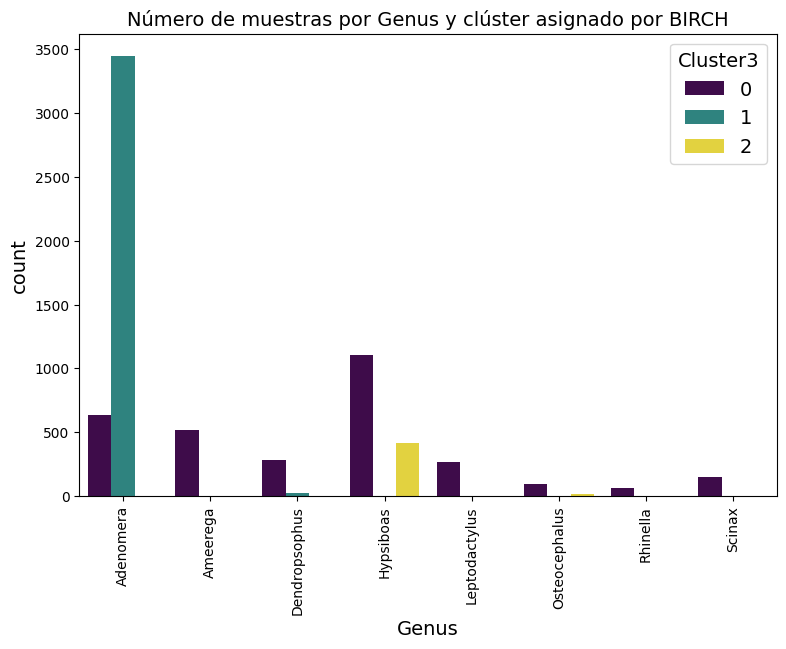

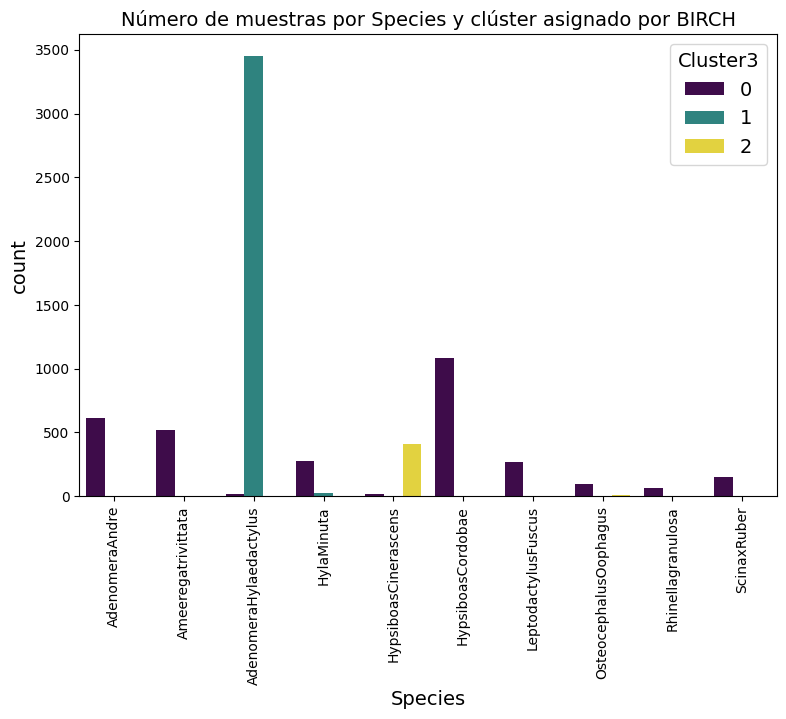

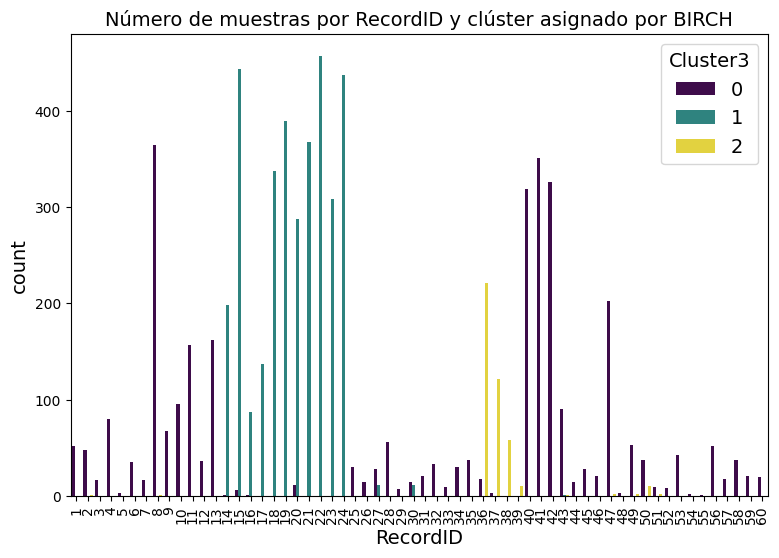

In [305]:
clusters = clf3.labels_
df_frogs['Cluster3'] = clusters

for col in ['Family', 'Genus', 'Species', 'RecordID']:
    plot_clusters(df_frogs, col, 'Cluster3', 'BIRCH')

Veamos a modo de resumen **todas las métricas**:

In [306]:
print("Modelo KMEANS -------------")
print("Silueta:", silhouette1)
print("DB:", db1)
print("CH:", ch1)
print("############################")
print("Modelo OPTICS -------------")
print("Silueta:", silhouette2)
print("DB:", db2)
print("CH:", ch2)
print("############################")
print("Modelo BIRCH -------------")
print("Silueta:", silhouette3)
print("DB:", db3)
print("CH:", ch3)

Modelo KMEANS -------------
Silueta: 0.372247494300013
DB: 1.2563244577057129
CH: 2241.4932501052676
############################
Modelo OPTICS -------------
Silueta: 0.21177888845872875
DB: 1.650987288147262
CH: 722.1908929967682
############################
Modelo BIRCH -------------
Silueta: 0.35632614198602175
DB: 1.2143582812774696
CH: 2435.1812486191584


\\
**ANÁLISIS FINAL**

Los resultados obtenidos, sin atender a nuestra *ground truth*, para K-Means son aceptables, basándonos sólo en las métricas utilizadas. El que peor comportamiento ha mostrado ha sido OPTICS, pues también ha clasificado muchas de las instancias como anomalías, habiendo hecho ya nosotros un análisis de dichas anomalías, y por tanto no asignándoles ningún cluster.

KMeans y BIRCH parecen proporcionar resultados similares y son los más efectivos en este conjunto de datos, con BIRCH mostrando un mejor rendimiento en términos de la métrica CH. OPTICS parece tener un rendimiento ligeramente inferior en comparación con los otros dos algoritmos, ya que sus métricas de silueta, DB y CH son más bajas. Considero que es razonable que KMeans se comporte mejor que los demás, pues al final, siguiendo la filosofía de la **navaja de Okham**, es el modelo más simple y que mejor funciona en general.

Cuando atendemos a las etiquetas que nos aporta el dataset de salida, la cosa cambia. Viendo las agrupaciones que han hecho los clústers obtenidos vemos una gran discrepancia con lo discutido: **una buena calidad del clústering no significa que se haya hecho una agrupación acorde a la realidad**. De hecho, si nos fijamos en los *count plots* hechos para cada una de las 4 etiquetas proporcionadas, sólo en el caso de las clases más pobladas, los modelos suelen hacer un agrupamiento acorde, aunque incluyen instancias de otras clases en la misma.

En cuanto a *RecordID*, ninguno de los modelos parece estar tomándolo como posible criterio de agrupación, pues el máximo de clústers usados son 5, tendrían que ser 60 en este caso. Para el resto de etiquetas, menos para *Family*, pasa un poco parecido, pues el número de clústers usados en los 3 modelos no se corresponden con los grupos reales.

Como hacíamos en el ejercicio 1, es importante hacer hincapié en lo determinante que puede ser **la distribución de nuestros datos** y cómo se agrupen en realidad. El enfoque de verlos en 3D es meramente visual y sólo nos puede dar *indicios* de cómo se colocan los datos realmente. Un problema de clustering no se aborda de igual manera sabiendo la distribución que tenemos, como hacíamos visible en el ejercicio 1.B apartado 3.

Por último, también creo que para este ejercicio en concreto, si conocíamos las etiquetas, podríamos haber **codificado** alguna de ellas, pues queremos agrupar realmente según una de ellas, no según las 4. Creo que esto nos podría haber dado información adicional a la hora de entrenar y podríamos haber obtenido mejores resultados. Sin embargo, se nos pedía cierta rigurosidad a la hora de tratarlo como un problema de **aprendizaje no supervisado**, y eso hemos hecho.

\\


## <font color='blue'>Ejercicio 3. DETECCIÓN de ANOMALÍAS con PyOD



### <font color='blue'> Ejemplo de uso de IsolationForest en un conjunto sintético.

<font color='blue'>A continuación, se muestra un ejemplo de uso de IsolationForest (https://pyod.readthedocs.io/en/latest/_modules/pyod/models/iforest.html) en un conjunto sintético. PyOD ofrece un wrapper del Isolation Forest de scikit-learn (https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html) con más funcionalidades.

#### <font color='blue'>Paso 1: Construimos el Modelo

<font color='blue'>Generamos $6$ variables y $500$ instancias para entrenamiento y test. Aunque los datos tienen la variable target $Y$, los modelos no supervisados solo usarán las variables $X$. La variable $Y$ es solo para validación. El porcentaje de outliers se pone al $5\%$ con `contamination=0.05`. Se dibuja un scatter plot de las dos primeras variables. Los puntos amarillos son outliers, y los puntos violeta son los datos normales.

In [307]:
!pip install pyod

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pyod.utils.data import generate_data
contamination = 0.05 # percentage of outliers
n_train = 500       # number of training points
n_test = 500        # number of testing points
n_features = 6      # number of features
X_train, X_test, y_train, y_test = generate_data(
    n_train=n_train,
    n_test=n_test,
    n_features= n_features,
    contamination=contamination,
    random_state=123)

X_train_pd = pd.DataFrame(X_train)
X_train_pd.head()

,0,1,2,3,4,5
0,2.396090,2.092611,2.073392,1.988262,1.953473,2.450997
1,1.631040,1.746182,1.898050,2.380148,1.967332,1.858916
2,1.824683,2.131412,2.028829,1.703454,2.502966,2.119108
3,2.106098,2.165173,2.340826,2.170109,1.749139,1.678661
4,1.829647,1.775596,1.829438,2.054768,1.577190,1.594549


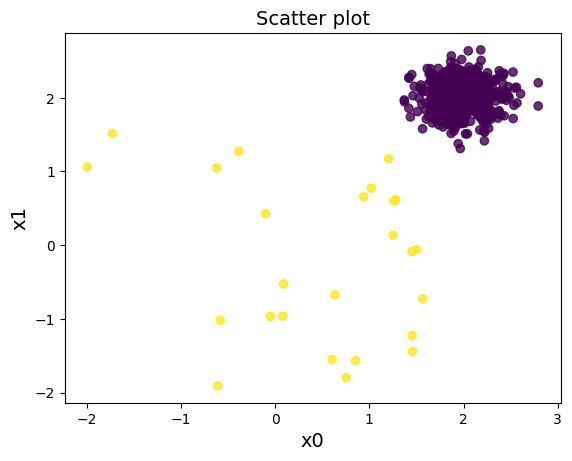

In [308]:
plt.scatter(X_train_pd[0], X_train_pd[1],c=y_train, alpha=0.8)
plt.title('Scatter plot')
plt.xlabel('x0')
plt.ylabel('x1')
plt.show()

<font color='blue'>Declaramos y ajustamos el modelo. El tamaño de un árbol `max_samples`es de $40$ instancias. En Isolation Forest (IForest, https://pyod.readthedocs.io/en/latest/pyod.models.html#module-pyod.models.iforest), no es necesario asignar un tamaño de árbol grande, puesto que tamaños pequeños pueden producir mejores iTrees. El porcentaje de outliers será $5\%$ usando `contamination=0.05`. Si no se indica, este valor se fijará automáticamente en $10\%$.

<font color='blue'>La función `decision_function()` genera el _outlier score_ de cada ejemplo del conjunto de datos, y la función `predict()` assigna las etiquetas ($1$: outlier; $0$: no outlier) basándose en la tasa de contaminación proporcionada ($5\%$ en nuestro caso). El umbral que vemos más abajo (`threshold_`) se emplea para identificar los `n_samples*contamination` ejemplos más atípicos de acuerdo a su `decision_scores_`.

In [309]:
from pyod.models.iforest import IForest
isft = IForest(contamination=0.05, max_samples=40, behaviour='new')
isft.fit(X_train)

# Training data
y_train_scores = isft.decision_function(X_train)
y_train_pred = isft.predict(X_train)

# Test data
y_test_scores = isft.decision_function(X_test)
y_test_pred = isft.predict(X_test) # outlier labels (0 or 1)

# Threshold for the defined comtanimation rate
print("The threshold for the defined contamination rate:" , isft.threshold_)

def count_stat(vector):
    # Because it is '0' and '1', we can run a count statistic.
    unique, counts = np.unique(vector, return_counts=True)
    return dict(zip(unique, counts))

print("The training data:", count_stat(y_train_pred))
print("The training data:", count_stat(y_test_pred))


The threshold for the defined contamination rate: -4.876307690970805e-15
The training data: {0: 475, 1: 25}
The training data: {0: 475, 1: 25}


<font color='blue'> Vemos que, efectivamente, este número de ejemplos más atípicos se corresponde con `X_train.shape[0]*0.05`.

In [310]:
X_train.shape[0]*0.05

25.0

<font color='blue'> Vamos a intentar marcar con una cruz roja los $25$ ejemplos más atípicos en la figura.  

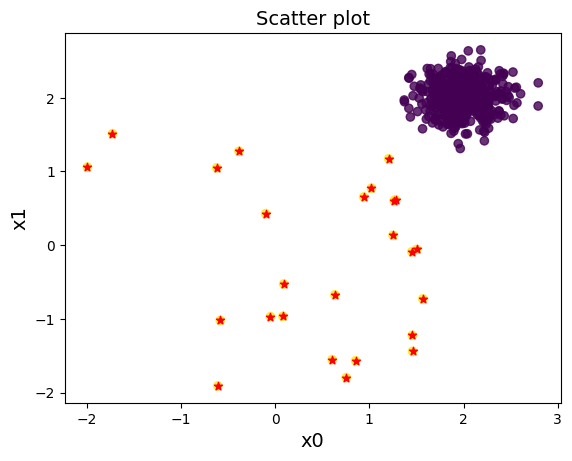

In [311]:
plt.scatter(X_train_pd[0], X_train_pd[1],c=y_train, alpha=0.8)
indexes = np.squeeze(np.array(np.where(isft.threshold_ < isft.decision_scores_)))
plt.scatter(X_train[indexes,0], X_train[indexes,1],marker='*',color='r')
plt.title('Scatter plot')
plt.xlabel('x0')
plt.ylabel('x1')
plt.show()

##### <font color='blue'>Paso 1.1: Parámetros del Modelo

In [312]:
isft.get_params()

{'behaviour': 'new',
 'bootstrap': False,
 'contamination': 0.05,
 'max_features': 1.0,
 'max_samples': 40,
 'n_estimators': 100,
 'n_jobs': 1,
 'random_state': None,
 'verbose': 0}

* <font color='blue'>`max_samples` es el número de muestras a escoger en $X$ para entrenar cada estimador base.
* <font color='blue'>`n_estimators` es el número de árboles en el ensemble. El valor por defecto es de 100 árboles.
* <font color='blue'>`max_features` es el número de características a escoger en $X$ para entrenar cada estimador base. El valor por defecto es $1.0$.
* <font color='blue'>`n_jobs` es el número de tareas a ejecutar en paralelo para `fit`y `predict`. El valor por defecto es $1.0$. Si se pone a $-1$, el número de tareas se iguala al número de cores.

##### <font color='blue'>Paso 1.2: Importancia de las Variables

<font color='blue'>Debido a que IForest trabaja dentro del marco de los árboles de decisión, podemos calcular y entender la importancia relativa de las características para determinar outliers. La importancia de las características se mide por el [índice de impureza Gini](https://en.wikipedia.org/wiki/Decision_tree_learning#Gini_impurity), cuya suma es $1.0$. A mayor valor, mayor importancia tiene la característica. En nuestro caso, la primera (índice $0$) y quinta (índice $4$) características serían las más relevantes.

In [313]:
isft_vi = isft.feature_importances_
isft_vi

array([0.15588478, 0.18237738, 0.19411993, 0.14206385, 0.14622985,
       0.17932421])

In [314]:
np.sum(isft_vi)

1.0

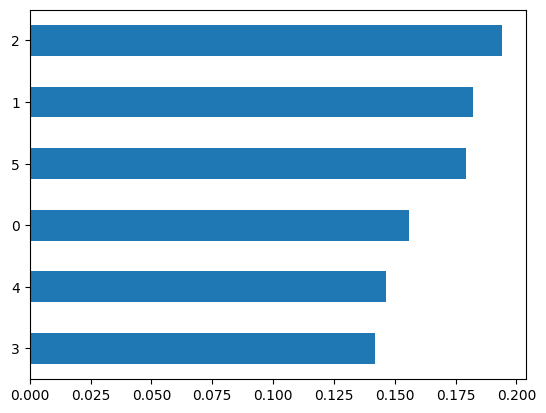

In [315]:
from matplotlib import pyplot as plt
for_plot = pd.DataFrame({'x_axis':X_train_pd.columns, 'y_axis':isft_vi}).sort_values(by='y_axis',ascending=True)
for_plot['y_axis'].plot.barh();

####<font color='blue'> Paso 2: Determinar un Umbral Razonable

<font color='blue'>El umbral se puede determinar por el histograma de los _outlier scores_. La siguiente figura sugiere un umbral alrededor de $0.0$. Esto significa que los scores de la mayoría de los datos normales son menores que $0.0$. Los scores de outlier de los datos anormales están en un rango más alto.

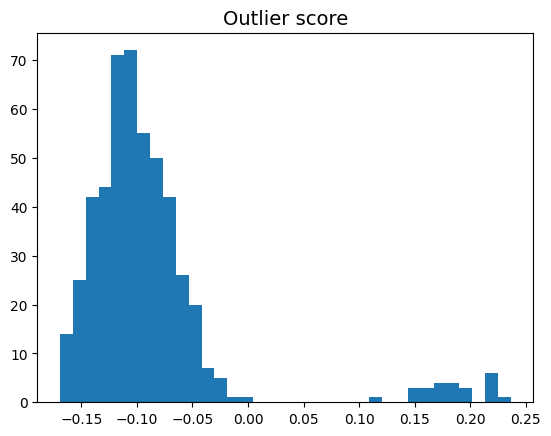

In [316]:
import matplotlib.pyplot as plt
plt.hist(y_train_scores, bins='auto') # arguments are passed to np.histogram
plt.title("Outlier score")
plt.show()

#### <font color='blue'>Paso 3: análisis estadístico descriptivo

<font color='blue'>Realicemos un análisis descriptivo de los grupos normal y outlier tanto en entrenamiento como en test. En esta ocasión utilizamos directamente el threshold calculado por Isolation Forest, pero debemos ser conscientes de que podemos emplear el valor que consideremos más oportuno (en base al histograma anterior o a cualquier otra información de que dispongamos). Dicho umbral hará que cambien las tablas que se muestran a continuación. Por ejemplo, si hacemos `threshold = isft.threshold_ - 0.05` veremos que se incrementa el porcentaje de ejemplos considerados outliers (pasando del $5\%$ al $11.2\%$).

In [317]:
threshold = isft.threshold_ # Or other value from the above histogram

def descriptive_stat_threshold(df,pred_score, threshold):
    # Let's see how many '0's and '1's.
    df = pd.DataFrame(df)
    df['Anomaly_Score'] = pred_score
    df['Group'] = np.where(df['Anomaly_Score']< threshold, 'Normal', 'Outlier')

    # Now let's show the summary statistics:
    cnt = df.groupby('Group')['Anomaly_Score'].count().reset_index().rename(columns={'Anomaly_Score':'Count'})
    cnt['Count %'] = (cnt['Count'] / cnt['Count'].sum()) * 100 # The count and count %
    stat = df.groupby('Group').mean().round(3).reset_index() # The avg.
    stat = cnt.merge(stat, left_on='Group',right_on='Group') # Put the count and the avg. together
    return (stat)

descriptive_stat_threshold(X_train,y_train_scores, threshold) #y_train_scores = isft.decision_scores_

,Group,Count,Count %,0,1,2,3,4,5,Anomaly_Score
0,Normal,475,95.0,2.003,2.011,2.006,1.991,2.008,1.985,-0.103
1,Outlier,25,5.0,0.454,-0.209,-0.475,-0.231,-0.035,-0.056,0.184


In [318]:
descriptive_stat_threshold(X_test,y_test_scores, threshold)

,Group,Count,Count %,0,1,2,3,4,5,Anomaly_Score
0,Normal,475,95.0,2.016,2.014,2.01,1.988,2.006,2.001,-0.101
1,Outlier,25,5.0,0.000,-0.540,-0.23,-0.052,-0.056,0.119,0.184


In [319]:
X_train[y_train==1,0].mean()

0.4535480626515198

<font color='blue'>Las tablas de arriba incluyen los elementos esenciales para la evaluación del modelo e interpretación de resultados.

* <font color='blue'>Tamaño del grupo de outlier (`Count %`) de las tablas. Muestra un $5\%$ en cada caso ($5.2\%$ en test). Es importante recordar que el tamaño del grupo de outliers viene determinado por el threshold, que a su vez se calcula en base a la contaminación proporcionada.
* <font color='blue'>La media del score de anomalía. En las tablas, la media del score del grupo de outlier es más grande que la del grupo normal, lo que confirma que el grupo  outlier debería tener y tiene mayores scores de anomalía.
* <font color='blue'>Estadísticas relativas a las variable de entrada agrupadas en normales (grupo $0$) y atípicas (grupo $1$). Por ejemplo, el valor asociado con la columna $0$ y fila $0$ (normal) se corresponde con `X_train[y_train==0,0].mean()`, es decir, $2.003$. La segunda fila (grupo $1$) de la misma columna sería `X_train[y_train==1,0].mean()`, es decir, $0.454$. Se puede observar que la media de las características en el grupo de outliers son más pequeñas que en el grupo de ejemplos normales. Si esto tiene sentido o no depende del problema en cuestión.


<font color='blue'>Debido a que tenemos el ground truth en nuestros datos, podemos generar una matriz de confusión para entender el rendimiento del modelo.

In [320]:
def confusion_matrix_threshold(
    actual,score, threshold):
    Actual_pred = pd.DataFrame({'Actual': actual, 'Pred': score})
    Actual_pred['Pred'] = np.where(Actual_pred['Pred']<=threshold,0,1)
    cm = pd.crosstab(Actual_pred['Actual'],Actual_pred['Pred'])
    return (cm)

confusion_matrix_threshold(y_train,y_train_scores,threshold)

Pred,0,1
Actual,,
0.0,475,0
1.0,0,25


### <font color='blue'>Ejercicio.

<font color='blue'>Tras el ejemplo anterior, ahora presentamos el ejercicio a resolver por el alumnado en relación a la detección de anomalías con PyOD (https://pyod.readthedocs.io/en/latest/). En concreto, los estudiantes trabajarán con el conjunto de datos _Statlog_ (satélite Landsat) del repositorio de aprendizaje automático de la UCI (https://odds.cs.stonybrook.edu/satellite-dataset/). Se trata de un conjunto de datos de clasificación multiclase, en donde se combinan las tres clases más pequeñas para formar la clase de valores atípicos. En PRADO el alumnado dispone del fichero `satellite.mat` con los datos necesarios para realizar el ejercicio. A continuación se aporta una descripción general del dataset:
* <font color='blue'> $X$ = datos puntuales multidimensionales,
* <font color='blue'> $y$ = etiquetas ($1$ = valores atípicos, $0$ = valores atípicos).
* <font color='blue'> $6435$ instancias, $36$ características y $2036$ ($32\%$) anomalías. Este último número se puede recuperar haciendo `np.sum(Y==1)`.

<font color='blue'> Referencias:
* <font color='blue'>  Liu, Fei Tony, Kai Ming Ting, and Zhi-Hua Zhou. “Isolation forest.” 2008 Eighth IEEE International Conference on Data Mining. IEEE, 2008.
* <font color='blue'>  K. M. Ting, J. T. S. Chuan, and F. T. Liu. “Mass: A New Ranking Measure for Anomaly Detection.“, IEEE Transactions on Knowledge and Data Engineering, 2009.




## <font color='blue'> Objetivos
    
<font color='blue'> El objetivo del presente ejercicio es analizar los patrones subyacentes a los datos, sin tomar en cuenta su _ground truth_, y determinar si las anomalías que se detectan con algoritmos avanzados coinciden con la realidad. Se debe usar un algoritmo cualquiera de la librería PyOD (https://github.com/yzhao062/pyod), como podría ser Isolation Forest. Se valorará positivamente que el estudiante escoga un algoritmo diferente, en cuyo caso, se proporcionará una breve explicación de su funcionamiento.

<font color='blue'> Para llevar a cabo este objetivo principal se llevarán a cabo los siguientes objetivos secundarios:
1. <font color='blue'> Realización de un análisis exploratorio para una primera observación de las distribuciones de los datos.
2. Construcción y ajuste del modelo.
3. Experimentación y determinación de los umbrales más razonables para la identificación de anomalías.
4. Comprobación de errores usando la información Ground Truth del conjunto de datos.

### <font color='blue'> Resultados Esperados
<font color='blue'> Se espera que los resultados que se obtengan de la detección de anomalías sean razonablemente parecidos a la realidad.
    
<font color='blue'>Como el fichero es un `.mat` (matlab), lo primero que haremos será tranformarlo en `.csv` para trabajar con él. Nos quedamos solo con la parte no supervisada (es decir, con las entradas, sin las salidas deseadas / etiquetas).

In [321]:
import scipy.io
import pandas as pd

from google.colab import drive
drive.mount("/content/drive/")

dataFolder = 'drive/MyDrive/Colab Notebooks/clustering/'

# Cargar el archivo .mat
mat = scipy.io.loadmat(dataFolder + '/satellite.mat')
print(mat.keys())

X = mat['X']
Y = mat['y']

# Convertir a un DataFrame de pandas ignorando las etiquetas
# IMPORTANTE: estamos ante un problema no supervisado. No podemos emplear las etiquetas para agrupar o analizar los datos.
df = pd.DataFrame(X)
df2 = pd.DataFrame(Y) #Lo usaremos solo para el análisis puramente exploratorio de los datos

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
dict_keys(['__header__', '__version__', '__globals__', 'X', 'y'])


In [322]:
print("Descripción general de los datos:")
df.describe()

Descripción general de los datos:


,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
count,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,...,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,69.400000,83.594872,99.290598,82.592696,69.150272,83.243512,99.110645,82.497125,68.912354,82.893085,...,99.214763,82.660606,68.944056,83.145610,99.111888,82.618026,68.727584,82.858897,98.926030,82.505361
std,13.605871,22.882234,16.645944,18.897674,13.561197,22.886495,16.664088,18.940923,13.470599,22.862255,...,16.612514,18.991281,13.492684,22.847199,16.704305,19.043661,13.401603,22.816959,16.695488,19.054274
min,39.000000,27.000000,53.000000,33.000000,39.000000,27.000000,50.000000,29.000000,40.000000,27.000000,...,50.000000,29.000000,39.000000,27.000000,50.000000,29.000000,39.000000,27.000000,50.000000,29.000000
25%,60.000000,71.000000,85.000000,69.000000,60.000000,71.000000,85.000000,69.000000,60.000000,71.000000,...,85.000000,69.000000,60.000000,71.000000,85.000000,69.000000,60.000000,71.000000,85.000000,68.000000
50%,68.000000,87.000000,101.000000,81.000000,68.000000,85.000000,101.000000,81.000000,67.000000,85.000000,...,100.000000,81.000000,68.000000,85.000000,100.000000,81.000000,67.000000,84.000000,100.000000,81.000000
75%,80.000000,103.000000,113.000000,92.000000,80.000000,103.000000,113.000000,92.000000,79.000000,102.000000,...,113.000000,92.000000,79.000000,103.000000,113.000000,92.000000,79.000000,103.000000,113.000000,92.000000
max,104.000000,137.000000,140.000000,154.000000,104.000000,137.000000,145.000000,157.000000,104.000000,130.000000,...,140.000000,154.000000,104.000000,130.000000,145.000000,157.000000,104.000000,130.000000,145.000000,157.000000


Vamos a hacer un **análisis exploratorio** de los datos, accediendo a nuestra ***ground truth*** pero teniendo cuidado de no tomar decisiones en base a ellas, pues estamos tratando un problema de aprendizaje no supervisado, y por ello tratamos de ser fieles a lo que sería un problema real de este tipo.

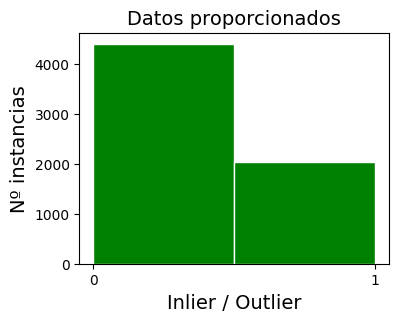

In [323]:
fig, ax = plt.subplots(figsize=(4, 3))
ax.hist(df2, bins=2, edgecolor = "white", color="green" )
ax.set_xlabel("Inlier / Outlier")
ax.set_ylabel("Nº instancias")
plt.xticks(range(0,2))
ax.set_title("Datos proporcionados")
plt.show()

In [324]:
counts = df2.sum()
print("Porcentaje real de outliers: ", counts[0] / 6435 * 100)

Porcentaje real de outliers:  31.63947163947164


Obvservamos lo que ya se nos proporcionaba en el enunciado del ejercicio, contamos con un dataset en el que **cerca del 32% de los datos son *outliers***. Se ve aquí visualmente la proporción de lo que son y no anomalías.

Ahora, con objetivo de visualizar mejor nuestros datos, podemos hacer una gráfica 2d, para ver cuáles son y no son outliers. Podemos enfocarlo haciendo una reducción de dimensionalidad hasta 2 componentes de nuestras características, de manera que podamos graficarlas y ver dónde se "encontrarían" estas anomalías dentro de la distribución de nuestros datos. Es importante remarcar que esta forma de visualizar los datos es puramente exploratoria y nos hace tener una mejor idea de los datos pero siempre teniendo cuidado y en mente que **estamos perdiendo información** de su distribución al graficarlos de esta manera.

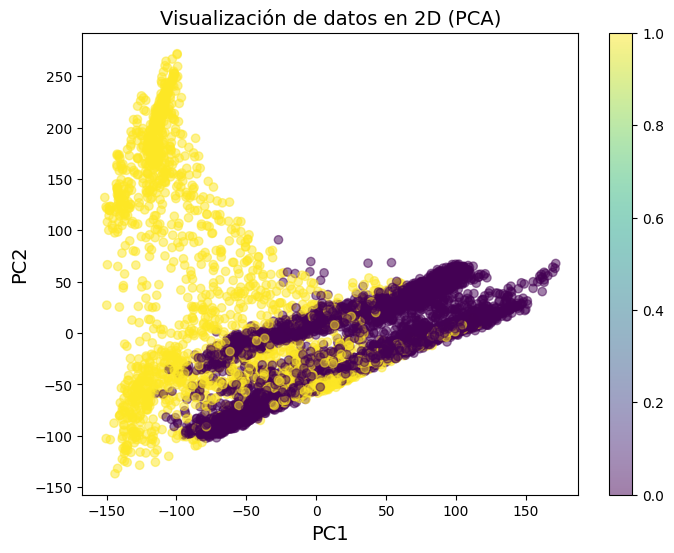

In [325]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])

#Graficamos los datos reducidos en 2D
plt.figure(figsize=(8, 6))
scatter = plt.scatter(df_pca['PC1'], df_pca['PC2'], c=Y, cmap='viridis', alpha=0.5)
plt.title('Visualización de datos en 2D (PCA)')
plt.xlabel('PC1')
plt.ylabel('PC2')

cbar = plt.colorbar(scatter)

plt.show()


Como vemos en la gráfica, aparentemente, hay dos grupos de datos levemente separados, en morado los *inliers* y en amarillo los *outliers*.

Es importante recordar que la visualización resultante representa una proyección de los datos originales en un **subespacio de menor dimensión**. Por tanto, la interpretación de los resultados puede no ser siempre directa. Los ejes principales (componentes principales) representan combinaciones lineales de las características originales, por lo que la interpretación de estos ejes puede no ser tan intuitiva como en el espacio original.

Vamos ahora con la elección del modelo, en concreto, uno basado en **densidad**:

He escogido ***Local Outlier Factor o LOF*** como método. Es un método *multivariate* (que encuentra valores atípicos por ejemplo o instancia, en lugar de por característica) que usa dicho *Factor* para medir la desviación local de la densidad de cierta muestra con respecto a sus vecinos. El término **local** se refiere a que mide cómo de aislado está nuestro ejemplo con respecto a sus vecinos más cercanos. De hecho, recuerda y es muy similar al modelo ***DBSCAN***, analizado en el primer ejercicio.

 Cuando encontramos muestra con una densidad mucho menor a la de sus vecinos los consideraremos outliers. Valores de LOF menores o similares a 1 significa mayor o igual densidad que los vecinos, respectivamente. Para valores mayores que 1, es una densidad menor que la de los vecinos $\implies$ outlier.
 <center><img src=https://upload.wikimedia.org/wikipedia/commons/thumb/5/59/LOF.svg/400px-LOF.svg.png></center>

 Imagen extraida de https://es.wikipedia.org/wiki/Valor_at%C3%ADpico_local

 El método LOF es especialmente útil para detectar anomalías en conjuntos de datos donde las anomalías no están necesariamente separadas espacialmente de los datos normales, ya que se basa en la densidad local en lugar de en umbrales de distancia fijos. Esto lo hace efectivo en datos de alta dimensionalidad donde otras técnicas pueden no funcionar tan bien.

 Cuando realicé el primer ejercicio, segundo apartado (1.B) me llamó particularmente la atención la técnica usada, **basada en la densidad** y las distintas aplicaciones que tiene. Es por esto que decidí optar por LOF, pero no por ello es mejor que el resto de técnicas, que pueden ser: basadas en el vecino más cercano, basadas en ensembles o one-class clasifition. A continuación, una comparativa gráfica de algunos de estos métodos:

 <center><img src=https://scikit-learn.org/stable/_images/sphx_glr_plot_anomaly_comparison_001.png width="500" height="500"></center>

 Imagen extraída de https://scikit-learn.org/stable/modules/outlier_detection.html#overview-of-outlier-detection-methods

 \\
 **Entrenamiento del modelo**

In [326]:
from pyod.models.lof import LOF
from pyod.utils.data import evaluate_print
from pyod.utils.example import visualize

lofOD = LOF(n_neighbors = 900, contamination=0.32)
lofOD.fit(df)

y_train_scores = lofOD.decision_function(df)
y_train_pred = lofOD.predict(df)

In [327]:
lofOD.get_params()

{'algorithm': 'auto',
 'contamination': 0.32,
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': 1,
 'n_neighbors': 900,
 'novelty': True,
 'p': 2}

El nivel de contaminación lo sabemos a priori, algo que no sabríamos en realidad en un problema real, en el cual tendríamos que intuir qué cantidad de los datos se han visto contaminados por ruido. Igualmente, como ya lo sabemos,  vamos a aprovecharnos y entrenamos con dicho parámetro. Para la métrica, *n_jobs*, *leaf_size*, *novelty*, etc. como no estamos tratando con una cantidad grande de datos, todos ellos debería funcionar bien, pues los que hay por defecto lo hacen bien.

**Análisis del número de vecinos (n_neighbors)**

Tras hacer varios entrenamientos encuentro mejores resultados para **n_neighbors = 900**. La elección de este hiperparámetro es muy sensible a la distribución de nuestros datos, pues va a considerar 900 vecinos para comparar el grado de densidad de cada muestra. Si escogemos un número de vecinos más bajo, encontrará mejor los outliers a nivel local. Si lo hacemos más grande, puede hacer que el algoritmo sea más robusto contra el ruido en los datos, ya que considera una mayor cantidad de vecinos y no se ve tan afectado por variaciones aleatorias en unos pocos puntos de datos. En nuestro caso, basándome en los resultados obtenidos (aquí estoy usando realmente la **ground truth**) y la distribución analizada antes del dataset, considero dejar este número alto de n_neighbors.

Aunque esta elección puede llevar a tiempos de ejecución más altos, de nuevo nuestro dataset no es tan grande como para que nos afecte.

\\
Vamos ahora con la determinación de un **Umbral Razonable**, haciendo un proceso similar al del ejemplo de IForest:

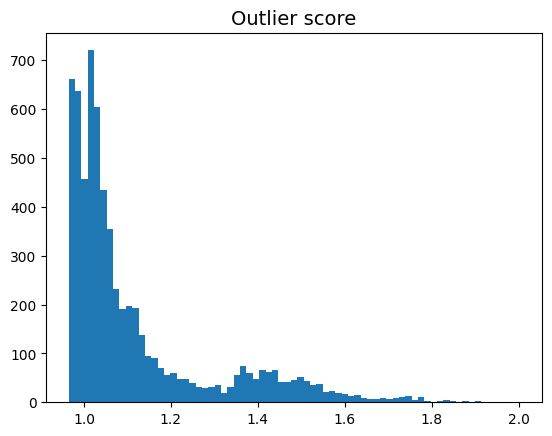

In [328]:
import matplotlib.pyplot as plt
plt.hist(y_train_scores, bins='auto')
plt.title("Outlier score")
plt.show()

Parece que a partir de $1.2$, aproximadamente es donde vemos mucha menos densidad de datos, por lo que parece que los datos normales, son los que tienen un score perteneciente a $[1,1.2]$, y a partir de este valor parece que podríamos considerar *outliers*, al menos gráficamente. Igualmente, ahora vamos a usar el devuelto por el modelo y comparar si cuadra con lo que nos hacemos una idea visualizando los scores:

In [329]:
threshold = lofOD.threshold_
descriptive_stat_threshold(df,y_train_scores, threshold) #y_train_scores = isft.decision_scores_

,Group,Count,Count %,0,1,2,3,4,5,6,...,27,28,29,30,31,32,33,34,35,Anomaly_Score
0,Normal,4380,68.065268,73.601,92.303,99.261,79.171,73.428,92.136,99.134,...,79.135,73.169,92.089,99.154,79.177,72.952,91.782,99.022,79.149,1.02
1,Outlier,2055,31.934732,60.445,65.036,99.355,89.886,60.034,64.291,99.062,...,90.176,59.938,64.085,99.022,89.953,59.724,63.840,98.722,89.659,1.32


In [330]:
# Threshold for the defined comtanimation rate
print("The threshold for the defined contamination rate:" , lofOD.threshold_)
print("The training data:", count_stat(y_train_pred))

The threshold for the defined contamination rate: 1.1029684180660577
The training data: {0: 4380, 1: 2055}


Resulta que LOF utiliza un *threshold* de 1.103, es decir, cercano al que habíamos probado. Detecta **2055** outliers, $≈$ **2036** outliers reales que se nos dan de **ground truth**.

Sin embargo, si tratamos de no basarnos en lo que sabemos de partida, el umbral sigue pareciendo adecuado pues visualmente, parece separar bien los *outlier scores* y parece que la media del *score* para el **grupo normal es muy cercana a 1** y **se aleja bastante más**, en 0.3 unidades, de 1 para el **grupo de outliers**.

\\
Igualmente, esto no quiere decir, que nuestro algoritmo esté detectando correctamente los outliers; ***puede ser que esté tratando como anomalías puntos normales y viceversa***. Para visualizar está *corrección* de los resultados vamos a usar la matriz de confusión, que nos da justamente los casos reales VS los casos predichos:

In [331]:
confusion_matrix_threshold(df2.squeeze(),y_train_scores,threshold) #Convertimos el Dataframe en una serie unidimensional

Pred,0,1
Actual,,
0,3693,706
1,687,1349


Los resultados dejan bastante que desear, pues clasifica mal $687 + 706 = 1393$ instancias en total, ya sea por falsa anomalía o falso inlier. Veámos algunas métricas que nos pueden ayudar más a entender cómo se están evaluando las anomalías usando nuestra **ground truth**, como hemos hecho al acceder a la matriz de confusión pues debemos saber si se han clasificado bien las instancias.



In [332]:
accuracy = (3693 + 1349)/(3693+706+687+1349)
print(accuracy)

0.7835275835275836


Se clasifican un **78%** de las anomalías correctamente. Veamos ahora **f1 score**:

In [333]:
recall = 1349/(1349+687)
precision = 1349/(1349+706)
f1_score = 2 * (precision * recall) / (precision+recall)
print(f1_score)

0.6594964556343192


 El **f1-Score** del **65.95%** es una media armónica de la precisión y el recall, proporcionando una medida equilibrada del rendimiento del modelo, especialmente útil cuando las clases están desbalanceadas (como es nuestro caso entre *inliers*/*outliers*). Podríamos decir que es una métrica más informativa en caso de tener más instancias de una clase que otra.

 En resumen, mientras que una *accuracy* del 78% y un *f1-Score* del 66% indican un rendimiento razonable del modelo, es importante tener en cuenta el contexto específico del problema, en este caso de cómo de decisivo es eliminar los *outliers* o anomalías y cómo de importante es no tenerlas en cuenta para el entrenamiento de algún modelo con los datos resultantes.

Por último, destacar que existen múltiples métodos de detección de anomalías y de hecho, existen métodos que agrupan todos los resultados de varios métodos usados y dan un mejor resultado, teóricamente. Igualmente, me habían llamado la atención los métodos basados en **densidad** y quería trabajar con LOF. Otra forma de tratar de obtener mejores resultados sería optimizar el threshold o los hiperparámetros del modelo usado.